# Загрузка данных

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import talib
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import yfinance as yf
import os
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from IPython.display import clear_output

%matplotlib inline

pd.set_option('display.max_columns', None)

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
def seed_everything_pt(seed: int = 42) -> None:
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print(f"Using {seed} seed")

In [4]:
seed_everything_pt()

Using 42 seed


In [22]:
# Загрузим из файла
eth_df = pd.read_csv('eth_data_2025_01_01_to_2025_02_19.csv', index_col=0, parse_dates=True)
eth_df 

,Close,High,Low,Open,Volume,btc_close
Datetime,,,,,,
2025-01-01 00:00:00+00:00,3337.285889,3337.397217,3330.587402,3331.279785,0,93330.968750
2025-01-01 00:15:00+00:00,3340.867188,3344.197266,3340.129639,3340.129639,203587584,93534.460938
2025-01-01 00:30:00+00:00,3352.541260,3353.072021,3341.765869,3341.765869,226148352,93711.296875
2025-01-01 00:45:00+00:00,3358.024658,3358.024658,3347.942627,3349.490234,0,94256.054688
2025-01-01 01:00:00+00:00,3354.194336,3357.458740,3349.236572,3357.458740,0,93956.867188
...,...,...,...,...,...,...
2025-02-19 22:45:00+00:00,2722.684570,2728.985596,2711.882812,2711.882812,762358784,96537.156250
2025-02-19 23:00:00+00:00,2721.705078,2729.082275,2721.705078,2723.190430,709018624,96615.671875
2025-02-19 23:15:00+00:00,2722.963623,2725.658203,2721.704834,2721.704834,1750604800,96667.070312


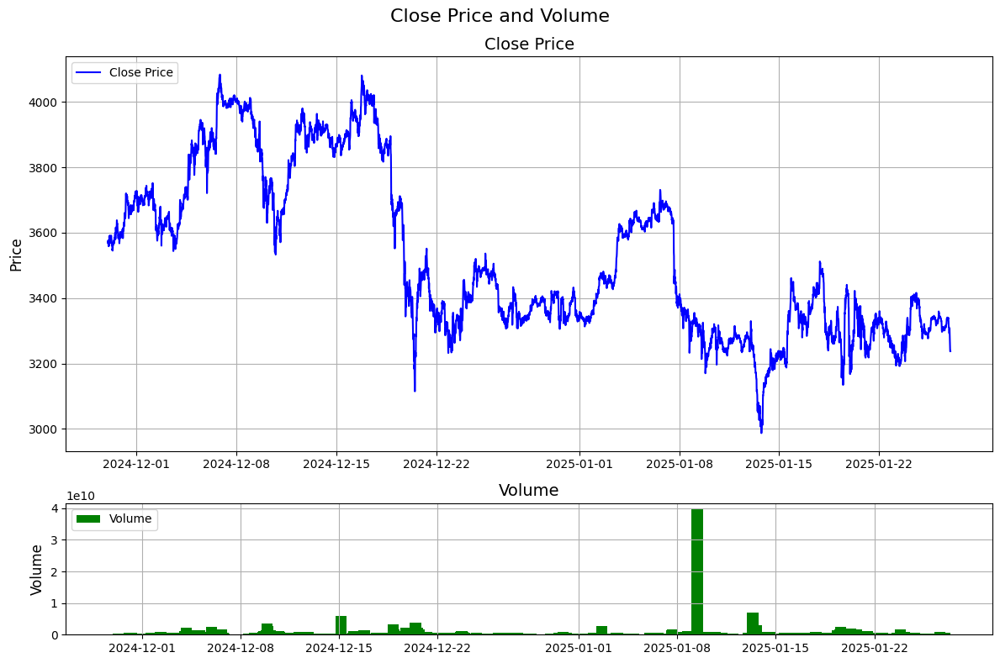

In [6]:
fig, (ax1, ax2) = plt.subplots(
    2, 1,  # 2 строки, 1 столбец
    figsize=(12, 8),  # Размер фигуры
    gridspec_kw={'height_ratios': [3, 1]}
)

# График Close (цена)
ax1.plot(eth_df.index, eth_df['Close'], label='Close Price', color='blue')
ax1.set_title('Close Price', fontsize=14)
ax1.set_ylabel('Price', fontsize=12)
ax1.legend(loc='upper left')
ax1.grid(True)

# График Volume (объем)
ax2.bar(eth_df.index, eth_df['Volume'], label='Volume', color='green')
ax2.set_title('Volume', fontsize=14)
ax2.set_ylabel('Volume', fontsize=12)
ax2.legend(loc='upper left')
ax2.grid(True)

# Настройка общего заголовка
plt.suptitle('Close Price and Volume', fontsize=16)

# Отображение графиков
plt.tight_layout()
plt.show()

In [10]:
start = '2025-01-01'
end = '2025-02-20'

In [12]:
btc_df = yf.download('BTC-USD', start=start, end=end, interval='15m', multi_level_index=False)
eth_df = yf.download('ETH-USD', start=start, end=end, interval='15m', multi_level_index=False)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [15]:
eth_df['btc_close'] = btc_df['Close']
eth_df

,Close,High,Low,Open,Volume,btc_close
Datetime,,,,,,
2025-01-01 00:00:00+00:00,3337.285889,3337.397217,3330.587402,3331.279785,0,93330.968750
2025-01-01 00:15:00+00:00,3340.867188,3344.197266,3340.129639,3340.129639,203587584,93534.460938
2025-01-01 00:30:00+00:00,3352.541260,3353.072021,3341.765869,3341.765869,226148352,93711.296875
2025-01-01 00:45:00+00:00,3358.024658,3358.024658,3347.942627,3349.490234,0,94256.054688
2025-01-01 01:00:00+00:00,3354.194336,3357.458740,3349.236572,3357.458740,0,93956.867188
...,...,...,...,...,...,...
2025-02-19 22:45:00+00:00,2722.684570,2728.985596,2711.882812,2711.882812,762358784,96537.156250
2025-02-19 23:00:00+00:00,2721.705078,2729.082275,2721.705078,2723.190430,709018624,96615.671875
2025-02-19 23:15:00+00:00,2722.963623,2725.658203,2721.704834,2721.704834,1750604800,96667.070312


In [16]:
eth_df.to_csv('eth_data_2025_01_01_to_2025_02_19.csv')

# 2. Подготовка данных

In [5]:
def fill_missing_values(data):
    """
    Функция заполняет пропущенные значения в DataFrame предыдущими значениями 
    и удаляет дубликаты по индексу.
    """
    df = data.copy()

    # Проверка и удаление дубликатов по индексу
    if df.index.duplicated().any():
        print("Обнаружены дубликаты по индексу. Они будут удалены.")
        df = df[~df.index.duplicated(keep='first')]
    else:
        print("Дубликатов не обнаружено.")

    # Проверка на наличие пропущенных значений и нулевых значений
    if df.isnull().any().any() or (df == 0).any().any():
        print("Обнаружены пропущенные или нулевые значения. Выполняется заполнение предыдущими значениями...")

        # Заменяем нули на NaN, чтобы их можно было заполнить
        df.replace(0, np.nan, inplace=True)
        
        # Заполняем пропущенные значения предыдущими
        df = df.fillna(method='ffill')
        
        # Если в начале есть NaN, заполняем их последующими значениями
        df = df.fillna(method='bfill')
    else:
        print("Пропущенные значения отсутствуют.")

    return df

In [6]:
# Функция для добавления лагов

def add_lags(data, columns, lags):
    """Функция для добавления лагов

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета лагов
        lags (List): список шагов назад для расчета лагов
    """
    df = data.copy()

    for lag in lags: # Добавляем лаги по шагам назад из lags
        for column in columns:
            new_col_name = f'{column}_lag_{lag}'
            df[new_col_name] = df[column].shift(lag)
    
    return df

In [7]:
# Функция для добавления индикаторов

def add_indicators(data, columns, windows_SMA, windows_RSI):
    """Функция для добавления индикаторов SMA и RSI

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета индикаторов
        windows_SMA (List): список окон для расчета MA
        windows_RSI (List): список окон для расчета RSI
    """
    df = data.copy()

    for window in windows_SMA: # Расчитываем и добавляем SMA по указанным колонкам
        for column in columns:
            new_col_name = f'{column}_SMA_{window}'
            df[new_col_name] = df[column].rolling(window).mean()

    for window in windows_RSI: # Расчитываем и добавляем RSI по указанным колонкам
        for column in columns:
            new_col_name = f'{column}_RSI_{window}'
            df[new_col_name] = talib.RSI(df[column], timeperiod=window)
    
    return df

In [8]:
# Функция для добавления статистик

def add_stats_features(data, columns, windows):
    """Функция для добавления статистик, min, max, std за периоды windows

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк для расчета статистик
        windows (List): список окон для расчета статистик
    """   
    df = data.copy()

    for column in columns:
        for window in windows:
            # Скользящее среднее
            df[f'{column}_mean_{window}'] = df[column].rolling(window=window).mean()
            
            # Скользящая медиана
            df[f'{column}_median_{window}'] = df[column].rolling(window=window).median()
            
            # Скользящий минимум
            df[f'{column}_min_{window}'] = df[column].rolling(window=window).min()
            
            # Скользящий максимум
            df[f'{column}_max_{window}'] = df[column].rolling(window=window).max()
            
            # Скользящее стандартное отклонение
            df[f'{column}_std_{window}'] = df[column].rolling(window=window).std()
            
            # Скользящий размах (макс - мин)
            df[f'{column}_range_{window}'] = df[f'{column}_max_{window}'] - df[f'{column}_min_{window}']

    return df

In [9]:
# Функция для добавления разницы между higt и low

def add_hight_low_dif(data):
    df = data.copy()
    df['High-Low'] = df['High'] - df['Low']
    return df

In [10]:
# Функция для добавления трендовых фичей

def add_trend_feat(data, columns, windows):
    """Функция для трендовых фичей

    Args:
        data (pd.Dataframe): pandas Dataframe с данными по активу
        columns (List): список колонорк трендовых фичей
        windows (List): список окон трендовых фичей
    """   
    df = data.copy()
    for column in columns:
        for window in windows:
            # Отношение текущего значения к предыдущему (лаг = 1)
            df[f'{column}_ratio_1'] = df[column] / df[column].shift(1)
            
            # Логарифмическое изменение (логарифм отношения текущего значения к предыдущему)
            df[f'{column}_log_diff_1'] = np.log(df[column] / df[column].shift(1))
            
            # Momentum (разница между текущим значением и значением N периодов назад)
            df[f'{column}_momentum_{window}'] = df[column] - df[column].shift(window)
            
            # Rate of Change (ROC): процентное изменение за N периодов
            df[f'{column}_roc_{window}'] = (df[column] - df[column].shift(window)) / df[column].shift(window) * 100
    
    return df    

In [11]:
import pickle

# Функция для нормализации данных
def normalize_dataframe(data, scaler="StandardScaler", save_scaler=True, scaler_file="scaler.pkl"):
    """Функция нормализует DataFrame с использованием заданного скейлера.

    Args:
    df (pd.DataFrame): Датафрейм для нормализации.
    scaler (str or sklearn Scaler): Имя скейлера ("StandardScaler", "MinMaxScaler", "RobustScaler") 
                                     или уже обученный объект скейлера.
    save_scaler (bool): сохранять ли scaler в файл (по умолчанию: сохранять)
    scaler_file (str): Имя файла, куда сохраняется обученный скейлер (по умолчанию: "scaler.pkl").

    """
    df = data.copy()

    if isinstance(scaler, str):
        # Создаем скейлер на основе переданного имени
        if scaler == "StandardScaler":
            scaler = StandardScaler()
        elif scaler == "MinMaxScaler":
            scaler = MinMaxScaler()
        elif scaler == "RobustScaler":
            scaler = RobustScaler()
        else:
            raise ValueError(f"Неизвестный скейлер: {scaler}")

        # Обучаем скейлер на датафрейме
        scaler.fit(df)

        # Сохраняем обученный скейлер в файл
        if save_scaler:
            with open(scaler_file, "wb") as f:
                pickle.dump(scaler, f)
    elif hasattr(scaler, "transform"):
        # Если передан обученный скейлер, просто используем его
        pass
    else:
        raise ValueError("Передан некорректный скейлер. Должна быть строка 'StandardScaler', 'MinMaxScaler', 'RobustScaler' или объект sklearn Scaler.")

    # Применяем скейлер к датафрейму
    normalized_data = scaler.transform(df)

    # Возвращаем нормализованный датафрейм и обученный скейлер
    return pd.DataFrame(normalized_data, columns=df.columns, index=df.index), scaler

In [12]:
# Функция для загрузки скейлера из файла
def load_scaler(scaler_file):
    """Загружает скейлер из указанного файла.

    Args:
    scaler_file (str): Путь к файлу, содержащему сохранённый скейлер.

    Return:
    sklearn Scaler: Загруженный объект скейлера.
    """
    with open(scaler_file, "rb") as f:
        scaler = pickle.load(f)
    return scaler

In [13]:
# Функция для добавления номеров месяцев, дней, часов

def add_datetime_features(data, add_month=True, add_weekday=True, add_hour=True):
    """Функция добавляет в DataFrame столбцы с номером месяца, дня недели и часа из индекса Datetime.
    
    Args:
    df (pd.DataFrame): DataFrame с индексом типа Datetime.
    add_month (bool): Добавлять ли столбец с номером месяца (1-12).
    add_weekday (bool): Добавлять ли столбец с номером дня недели (0 - понедельник, 6 - воскресенье).
    add_hour (bool): Добавлять ли столбец с номером часа (0-23).
    """
    df = data.copy()
    
    # Добавляем столбцы по выбору
    if add_month:
        df['Month'] = df.index.month
    if add_weekday:
        df['Weekday'] = df.index.weekday
    if add_hour:
        df['Hour'] = df.index.hour
    
    return df

In [14]:
def prepare_date(data, 
                 lags, 
                 windows_SMA, 
                 windows_RSI, 
                 windows_stats, 
                 windows_trend, 
                 add_month=True, 
                 add_weekday=True, 
                 add_hour=True):
    """
    Функция для добавления фичей и нормализации

    Args:
        data (pd.DataFrame): DataFrame с индексом типа Datetime.
        windows_SMA (List): список окон для индикатора SMA.
        windows_RSI (List): список окон для индикатора RSI.
        windows_stats (List): список окон для статистических фичей.
        windows_trend (List): список окон для трендовых фичей.
        add_month (bool): Добавлять ли столбец с номером месяца (1-12).
        add_weekday (bool): Добавлять ли столбец с номером дня недели (0 - понедельник, 6 - воскресенье).
        add_hour (bool): Добавлять ли столбец с номером часа (0-23).
    """

    df = data.copy()
    columns = df.columns

    df = fill_missing_values(df)
    df = add_lags(df, columns=columns, lags=lags)
    df = add_indicators(df, columns=['Close'], windows_SMA=windows_SMA, windows_RSI=windows_RSI)
    df = add_stats_features(df, columns=['Close', 'btc_close'], windows=windows_stats)
    df = add_hight_low_dif(df)
    df = add_trend_feat(df, columns=['Close', 'btc_close'], windows=windows_trend)
    df = add_datetime_features(df, add_month=add_month, add_weekday=add_weekday, add_hour=add_hour)
    df = df.dropna()

    return df

In [23]:
eth_df.describe()

,Close,High,Low,Open,Volume,btc_close
count,4793.000000,4793.000000,4793.000000,4793.000000,4.793000e+03,4793.000000
mean,3105.852702,3111.777687,3099.730503,3105.873248,3.600372e+08,98957.213325
std,324.334380,323.974483,324.695623,324.282645,7.586959e+08,3769.693119
min,2440.854492,2475.266602,2196.839600,2451.004395,0.000000e+00,90396.179688
25%,2722.056152,2727.046875,2717.524414,2721.784668,1.536205e+07,96196.289062
50%,3228.159180,3233.700195,3221.138916,3228.282959,1.586309e+08,97819.164062
75%,3331.842529,3336.928223,3326.113770,3331.485107,5.185659e+08,102190.984375
max,3731.067139,3742.588135,3727.289307,3732.922119,3.963021e+10,108837.968750


In [29]:
eth_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4793 entries, 2025-01-01 00:00:00+00:00 to 2025-02-19 23:45:00+00:00
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Close      4793 non-null   float64
 1   High       4793 non-null   float64
 2   Low        4793 non-null   float64
 3   Open       4793 non-null   float64
 4   Volume     4793 non-null   int64  
 5   btc_close  4793 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 262.1 KB


In [15]:
window_lag = [3, 9, 15, 30]
window_SMA = [6, 9, 30, 50]
window_RSI = [4, 9, 20]
windows_stats = [3, 10, 30, 50]
windows_trend = [3, 10, 30, 50]

In [24]:
eth_df_features = prepare_date(eth_df, lags=window_lag, windows_SMA=window_SMA, 
                               windows_RSI=window_RSI, windows_stats=windows_stats, 
                               windows_trend=windows_trend)

Дубликатов не обнаружено.
Обнаружены пропущенные или нулевые значения. Выполняется заполнение предыдущими значениями...


In [25]:
eth_df_features.shape

(4743, 109)

## 2.1 Попробуем предсказывать тренд через час. 

In [27]:
def add_target_column(df, close_col='Close', threshold=1):
    """
    Добавляет колонку target в датафрейм на основе процентного изменения цены через час.

    - df: Исходный датафрейм.
    - close_col: Название колонки с ценами закрытия.
    - threshold: Пороговое значение процента для классификации.
    """
    # Рассчитываем процентное изменение цены через час
    df['price_change_pct'] = df[close_col].pct_change(periods=4).shift(-4) * 100

    # Создаем колонку target на основе условий
    df['target'] = np.select(
        [
            df['price_change_pct'] < -threshold,  # Цена упала на threshold и больше
            (df['price_change_pct'] >= -threshold) & (df['price_change_pct'] <= threshold),  # Цена в пределах threshold
            df['price_change_pct'] > threshold  # Цена выросла на threshold и больше
        ],
        [0, 1, 2],  # Соответствующие классы
        default=np.nan  # Если значение NaN (последние 4 строки)
    )

    # Удаляем временную колонку price_change_pct
    df.drop(columns=['price_change_pct'], inplace=True)

    # Удаляем строки с NaN в target (последние 4 строки)
    df.dropna(subset=['target'], inplace=True)

    # Преобразуем target в целые числа
    df['target'] = df['target'].astype(int)

    return df

In [28]:
eth_df_features = add_target_column(eth_df_features, threshold=0.2)

eth_df_features

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-01 12:30:00+00:00,3343.072754,3344.783691,3341.038330,3343.430420,4.343808e+07,93679.632812,3334.746826,3339.170166,3334.012695,3337.341064,4.343808e+07,93267.125000,3325.237549,3328.333740,3323.114502,3323.114502,9.007104e+06,93254.468750,3330.404053,3333.293213,3328.243164,3331.517090,5076992.0,93259.992188,3339.198975,3339.198975,3334.000000,3334.000000,1.054720e+06,93447.375000,3336.257935,3331.594265,3332.004256,3337.854551,87.426735,68.418219,57.020899,3340.554118,3343.072754,3335.316406,3343.273193,4.537098,7.956787,3330.958594,3330.569214,3319.422119,3343.273193,8.375223,23.851074,3332.004256,3334.248535,3312.978760,3343.273193,7.791334,30.294434,3337.854551,3338.296997,3312.978760,3358.024658,10.136359,45.045898,93513.197917,93616.367188,93243.593750,93679.632812,235.617147,436.039062,93304.431250,93258.507812,93111.765625,93679.632812,195.346178,567.867188,93349.735156,93330.218750,92867.187500,93679.632812,214.242752,812.445312,93471.558125,93515.777344,92867.187500,94256.054688,255.901936,1388.867188,3.745361,0.999940,-0.000060,8.325928,0.249672,17.716309,0.532764,3.873779,0.116009,5.786865,0.173400,1.000676,0.000676,412.507812,0.442286,442.554688,0.474655,232.257812,0.248544,348.664062,0.373578,1,2,12,0
2025-01-01 12:45:00+00:00,3340.229736,3340.972900,3338.161133,3340.972900,4.343808e+07,93618.367188,3335.316406,3335.985107,3333.931885,3334.479492,4.343808e+07,93243.593750,3324.588379,3329.039795,3323.121826,3325.411865,9.007104e+06,93138.328125,3325.482666,3333.349854,3325.310059,3330.390137,191223808.0,93106.484375,3342.497070,3342.497070,3338.213135,3338.907959,9.932800e+06,93582.289062,3338.470459,3333.332194,3331.928678,3337.841802,67.214291,62.324199,54.907598,3342.191895,3343.072754,3340.229736,3343.273193,1.702232,3.043457,3332.457812,3334.465332,3319.422119,3343.273193,8.576754,23.851074,3331.928678,3334.248535,3312.978760,3343.273193,7.696461,30.294434,3337.841802,3338.296997,3312.978760,3358.024658,10.132893,45.045898,93638.122396,93618.367188,93616.367188,93679.632812,35.962981,63.265625,93340.821094,93264.835938,93111.765625,93679.632812,217.628245,567.867188,93350.937760,93330.218750,92867.187500,93679.632812,215.689528,812.445312,93473.236250,93515.777344,92867.187500,94256.054688,256.597023,1388.867188,2.811768,0.999150,-0.000851,4.91333

In [29]:
print("Количество каждого класса:")
print(eth_df_features['target'].value_counts())

Количество каждого класса:
target
0    1666
2    1654
1    1419
Name: count, dtype: int64


In [30]:
val_size = 350  # Размер валидационной выборки
test_size = 250  # Размер тестовой выборки

# Валидационная выборка
val_df = eth_df_features.iloc[-(val_size + test_size):-test_size]

# Тестовая выборка
test_df = eth_df_features.iloc[-test_size:]

# Обучающая выборка (все остальные данные)
train_df = eth_df_features.iloc[:-(val_size + test_size)]

# Проверка размеров выборок
print(f"Размер обучающей выборки (train): {len(train_df)}")
print(f"Размер валидационной выборки (val): {len(val_df)}")
print(f"Размер тестовой выборки (test): {len(test_df)}")

print("Количество каждого класса в обучающей выборке:")
print(train_df['target'].value_counts())

print("Количество каждого класса в валидационной выборке:")
print(val_df['target'].value_counts())

print("Количество каждого класса в тестовой выборке:")
print(test_df['target'].value_counts())

Размер обучающей выборки (train): 4139
Размер валидационной выборки (val): 350
Размер тестовой выборки (test): 250
Количество каждого класса в обучающей выборке:
target
0    1477
2    1439
1    1223
Name: count, dtype: int64
Количество каждого класса в валидационной выборке:
target
1    135
2    115
0    100
Name: count, dtype: int64
Количество каждого класса в тестовой выборке:
target
2    100
0     89
1     61
Name: count, dtype: int64


In [31]:
# Разделяем данные на фичи и целевую переменную
features_train = train_df.drop(columns=['target'])
target_train = train_df['target']

features_val = val_df.drop(columns=['target'])
target_val = val_df['target']

features_test = test_df.drop(columns=['target'])
target_test = test_df['target']

In [32]:
# нормализация X
X_train_scaled, scaler = normalize_dataframe(features_train, scaler='StandardScaler', save_scaler=True)

# Применение того же scaler к валидационной и тестовой выборкам
X_val_scaled, _ = normalize_dataframe(features_val, scaler=scaler, save_scaler=False)
X_test_scaled, _ = normalize_dataframe(features_test, scaler=scaler, save_scaler=False)

In [33]:
# Создаем новые датафреймы с нормализованными данными
train_scaled_df = pd.DataFrame(X_train_scaled, columns=features_train.columns, index=features_train.index)
val_scaled_df = pd.DataFrame(X_val_scaled, columns=features_val.columns, index=features_val.index)
test_scaled_df = pd.DataFrame(X_test_scaled, columns=features_test.columns, index=features_test.index)

# Добавляем целевую переменную обратно
train_scaled_df['target'] = target_train
val_scaled_df['target'] = target_val
test_scaled_df['target'] = target_test

In [34]:
train_scaled_df

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-01-01 12:30:00+00:00,0.590429,0.577234,0.603151,0.591622,-0.418599,-1.473717,0.562128,0.557743,0.579164,0.570627,-0.418264,-1.579272,0.528828,0.520013,0.541430,0.521892,-0.461830,-1.579492,0.543556,0.534093,0.555992,0.547221,-0.466321,-1.574844,0.566876,0.547963,0.569252,0.549770,-0.469179,-1.519765,0.567785,0.552256,0.551777,0.569459,1.741945,1.249194,0.705882,0.582081,0.589928,0.587391,0.568479,-0.413118,-0.464849,0.550082,0.547859,0.575882,0.527615,-0.449302,-0.526641,0.551777,0.556842,0.624571,0.455217,-0.853766,-0.946261,0.569459,0.567129,0.670782,0.451631,-0.884552,-0.952752,-1.518279,-1.491223,-1.550620,-1.510142,0.424076,0.375556,-1.575770,-1.586051,-1.518228,-1.572196,-0.392112,-0.441626,-1.573021,-1.576568,-1.464569,-1.664341,-0.740122,-0.802252,-1.550555,-1.534786,-1.380479,-1.587257,-0.844640,-0.720135,-0.739272,-0.002497,-0.000311,0.377773,0.341378,0.451501,0.411122,0.112690,0.098215,0.141717,0.123923,0.237196,0.238541,0.819596,0.877065,0.490931,0.521815,0.137261,0.139241,0.163873,0.165771,-0.646492,-0.500256,0.071241,0
2025-01-01 12:45:00+00:00,0.581150,0.564761,0.593785,0.583597,-0.418599,-1.489566,0.563989,0.547307,0.578901,0.561273,-0.418264,-1.585357,0.526703,0.522331,0.541454,0.529415,-0.461830,-1.609483,0.527417,0.534279,0.546400,0.543523,-0.226179,-1.614432,0.577738,0.558856,0.583088,0.565940,-0.457716,-1.485072,0.575019,0.557944,0.551528,0.569417,0.807694,0.843211,0.504990,0.587430,0.589928,0.603393,0.568479,-0.783388,-0.801881,0.554991,0.560611,0.575882,0.527615,-0.432411,-0.526641,0.551528,0.556842,0.624571,0.455217,-0.858613,-0.946261,0.569417,0.567129,0.670782,0.451631,-0.884691,-0.952752,-1.485927,-1.490706,-1.453847,-1.510142,-0.789659,-0.805213,-1.566322,-1.584410,-1.518228,-1.572196,-0.302037,-0.441626,-1.572707,-1.576568,-1.464569,-1.664341,-0.736437,-0.802252,-1.550113,-1.534786,-1.380479,-1.587257,-0.843201,-0.720135,-0.816474,-0.184784,-0.181652,0.231959,0.209021,0.388043,0.352943,0.033682,0.025210,0.075820,0.062810,-0.235313,-0.234001,0.744355,0.796523,0.402454,0.426908,0.010947,0.004102,0.026821,0.019178,-0.646492,-0.500256,0.071241,1
2025-01-01 13:00:00+00:00,0.557011,0.577865,0.576446,0.581020,-0.441147,-1.527053,0.589985,0.571186,0.583897,0.564495,-0.418264,-1.488970,0.509792,0.507558,0.529377,0.525394,-0.277129,-1.616343,0.486412,

In [41]:
val_scaled_df

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-13 17:00:00+00:00,-1.713173,-1.732787,-1.718707,-1.745389,1.450327,-0.959866,-1.748666,-1.728241,-1.722898,-1.703913,0.333564,-1.012805,-1.719623,-1.727437,-1.701151,-1.707880,0.376722,-0.894764,-1.656095,-1.667069,-1.642221,-1.655337,-0.427691,-0.880378,-1.591905,-1.617045,-1.596886,-1.617602,-0.457726,-0.796639,-1.724680,-1.712270,-1.674946,-1.641870,0.119371,-0.341568,-0.755562,-1.738966,-1.740511,-1.731741,-1.743511,-0.083093,-0.043899,-1.713533,-1.719475,-1.683620,-1.715577,-0.169760,-0.052951,-1.674946,-1.671583,-1.602306,-1.736016,-0.351687,-0.424976,-1.641870,-1.653550,-1.549117,-1.674321,-0.244422,-0.226404,-1.009441,-1.010560,-1.018076,-0.997775,0.119668,0.169518,-0.936067,-0.921710,-0.948531,-0.892019,0.050146,0.224865,-0.892248,-0.896318,-0.826875,-0.992855,-0.639180,-0.622155,-0.860994,-0.871257,-0.738064,-0.931981,-0.697504,-0.602661,-0.114873,1.250289,1.242107,0.441969,0.502219,-0.008095,-0.021502,-0.533733,-0.634017,-0.883447,-1.025590,1.380389,1.379221,0.411889,0.429327,-0.276181,-0.292301,-0.394387,-0.417463,-0.806523,-0.837926,1.546811,0.005622,0.794313,0
2025-02-13 17:15:00+00:00,-1.700159,-1.722404,-1.709241,-1.715289,1.450327,-0.919781,-1.742356,-1.760786,-1.738712,-1.755563,-0.438414,-1.008852,-1.725385,-1.737308,-1.728937,-1.723163,0.167909,-0.928691,-1.634771,-1.642063,-1.636822,-1.663274,-0.030307,-0.835331,-1.594727,-1.619972,-1.574359,-1.599569,0.089395,-0.800737,-1.728856,-1.710554,-1.679508,-1.647106,0.390466,-0.134262,-0.599296,-1.726026,-1.714723,-1.731741,-1.730453,0.235021,0.229595,-1.712564,-1.714631,-1.683620,-1.715577,-0.169468,-0.052951,-1.679508,-1.677975,-1.602306,-1.736016,-0.378862,-0.424976,-1.647106,-1.658421,-1.549117,-1.674321,-0.270324,-0.226404,-0.979426,-0.960665,-1.018076,-0.957806,0.634716,0.660336,-0.938277,-0.927770,-0.948531,-0.892019,0.037620,0.224865,-0.895930,-0.901791,-0.826875,-0.992855,-0.651756,-0.622155,-0.866480,-0.874708,-0.738064,-0.946458,-0.733683,-0.640458,-0.093009,0.359958,0.359837,0.529814,0.602966,0.107760,0.112379,-0.471413,-0.562536,-0.727226,-0.852350,0.572602,0.573589,0.690377,0.721204,-0.102618,-0.111461,-0.284356,-0.303261,-0.555964,-0.582628,1.546811,0.005622,0.794313,0
2025-02-13 17:30:00+00:00,-1.693053,-1.708388,-1.685291,-1.705698,0.668774,-0.900389,-1.762601,-1.751374,-1.737010,-1.741

In [42]:
test_scaled_df

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour,target
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-17 08:30:00+00:00,-1.511526,-1.528331,-1.525937,-1.549586,-0.219611,-0.862242,-1.560725,-1.585578,-1.556079,-1.581995,2.438679,-0.852436,-1.584362,-1.603020,-1.568240,-1.583757,1.727781,-0.773706,-1.643385,-1.659362,-1.617887,-1.643776,2.136812,-0.843823,-1.627089,-1.652429,-1.615235,-1.634459,-0.384107,-0.760867,-1.546236,-1.550828,-1.610587,-1.630374,0.790552,0.954918,0.903044,-1.527412,-1.518502,-1.521577,-1.541187,-0.206572,-0.232720,-1.554660,-1.558866,-1.506142,-1.595592,-0.568308,-0.607429,-1.610587,-1.612207,-1.493705,-1.688194,-0.678338,-0.746807,-1.630374,-1.640097,-1.440857,-1.759826,-0.886802,-0.989026,-0.851776,-0.855303,-0.823798,-0.874398,-0.692919,-0.685911,-0.825727,-0.834635,-0.776675,-0.880761,-0.531677,-0.650386,-0.822674,-0.831920,-0.653886,-0.947887,-0.919416,-1.009723,-0.778369,-0.805319,-0.563795,-0.854609,-0.663121,-0.832882,0.153355,0.984364,0.978945,0.623814,0.696812,0.490168,0.546303,0.398520,0.439760,0.236367,0.246473,-0.112588,-0.111207,-0.072354,-0.077929,-0.383341,-0.402031,-0.240976,-0.257827,-0.567494,-0.593073,1.546811,-1.512012,-0.507216,2
2025-02-17 08:45:00+00:00,-1.466013,-1.487773,-1.475481,-1.500644,1.010184,-0.832953,-1.520228,-1.544968,-1.558553,-1.568779,-0.274782,-0.835340,-1.568425,-1.585285,-1.559994,-1.586211,0.683548,-0.775487,-1.625698,-1.647472,-1.675784,-1.647239,0.912501,-0.800304,-1.653904,-1.649886,-1.639050,-1.627022,0.640026,-0.813738,-1.534293,-1.540462,-1.605295,-1.628537,1.308608,1.422157,1.337490,-1.510390,-1.512984,-1.521577,-1.495522,0.648445,0.723762,-1.543733,-1.550562,-1.506142,-1.549633,-0.324257,-0.184506,-1.605295,-1.605800,-1.493705,-1.641797,-0.591830,-0.513873,-1.628537,-1.640097,-1.440857,-1.713028,-0.835609,-0.809141,-0.850715,-0.855303,-0.823798,-0.871229,-0.651372,-0.646985,-0.831393,-0.836354,-0.776675,-0.881727,-0.584557,-0.655747,-0.822991,-0.832819,-0.653886,-0.947887,-0.918422,-1.009723,-0.783272,-0.811785,-0.563795,-0.854609,-0.689591,-0.832882,-0.103769,1.202675,1.195010,0.690013,0.767965,0.816239,0.917367,0.682664,0.770062,0.366299,0.396157,0.415937,0.417131,0.021566,0.019892,-0.252391,-0.266269,-0.035698,-0.045039,-0.498634,-0.522434,1.546811,-1.512012,-0.507216,2
2025-02-17 09:00:00+00:00,-1.438223,-1.461561,-1.438553,-1.464349,0.656635,-0.811330,-1.551761,-1.546339,-1.526533,-1.522

In [35]:
# Функция для создания окон
def create_windows(data, window_size=30, target_col='target'):
    X, y = [], []
    for i in range(window_size, len(data)):
        X.append(data.iloc[i-window_size:i].drop(columns=[target_col]).values)  # Окно фичей
        y.append(data.iloc[i - 1][target_col])  # Целевая переменная (значение таргета в последней строке окна)
    return np.array(X), np.array(y)

In [36]:
# Создаем окна для train, validation и test
window_size = 30
X_train, y_train = create_windows(train_scaled_df, window_size=window_size)
X_val, y_val = create_windows(val_scaled_df, window_size=window_size)
X_test, y_test = create_windows(test_scaled_df, window_size=window_size)

# Проверяем размерности
print(X_train.shape, X_val.shape, X_test.shape)
print(y_train.shape, y_val.shape, y_test.shape)

(4109, 30, 109) (320, 30, 109) (220, 30, 109)
(4109,) (320,) (220,)


In [37]:
# Преобразование в тензоры PyTorch
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

In [38]:
num_classes = 3

# Преобразование в one-hot
y_train_one_hot = F.one_hot(y_train_tensor, num_classes=num_classes)
y_val_one_hot = F.one_hot(y_val_tensor, num_classes=num_classes)
y_test_one_hot = F.one_hot(y_test_tensor, num_classes=num_classes)

y_train_one_hot = y_train_one_hot.float()
y_val_one_hot = y_val_one_hot.float()
y_test_one_hot = y_test_one_hot.float()

print("y_train one-hot:\n", y_train_one_hot)
print("y_val one-hot:\n", y_val_one_hot)
print("y_test one-hot:\n", y_test_one_hot)

y_train one-hot:
 tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 0., 1.],
        ...,
        [1., 0., 0.],
        [0., 0., 1.],
        [0., 0., 1.]])
y_val one-hot:
 tensor([[0., 0., 1.],
        [0., 1., 0.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        [1., 0., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 1., 0.],
        [1., 0., 0.],
        [1., 0., 0.],
        [0., 1., 0.],
        [1., 0., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 0., 1.],
        [0., 1., 0.],
        [1., 0., 0.],
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 1., 0.],
        [0., 0., 1.],
        [0., 1., 0.],
        [0., 1., 0.],
        [0., 0., 1.],
        [0., 1., 0.],
        [0., 1., 0.],
      

In [39]:
# Преобразование в тензоры PyTorch
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

In [48]:
# Проверяем размерности
print(X_train_tensor.shape, X_val_tensor.shape, X_test_tensor.shape)
print(y_train_one_hot.shape, y_val_one_hot.shape, y_test_one_hot.shape)

torch.Size([4109, 30, 109]) torch.Size([320, 30, 109]) torch.Size([220, 30, 109])
torch.Size([4109, 3]) torch.Size([320, 3]) torch.Size([220, 3])


In [49]:
# Создание TensorDataset для train, val и test
train_dataset = TensorDataset(X_train_tensor, y_train_one_hot)
val_dataset = TensorDataset(X_val_tensor, y_val_one_hot)
test_dataset = TensorDataset(X_test_tensor, y_test_one_hot)

batch_size = 32  # Размер мини-батча

# Создание DataLoader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# 3. Обучение нейросети

In [41]:
from sklearn.metrics import classification_report, roc_auc_score

# Функция для вывода метрик
def evaluate_model(y_true, y_pred, y_prob, name):
    print(f"\n=== Метрики для {name} выборки ===")
    
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=['Class 0', 'Class 1', 'Class 2']))
    
    # ROC AUC (для многоклассовой классификации)
    roc_auc = roc_auc_score(y_true, y_prob, multi_class='ovr', average='macro')
    print(f"ROC AUC (OvR, macro): {roc_auc:.4f}")

In [42]:
def get_predictions(model, dataloader, device):
    '''Функция для получения предсказаний и вероятностей'''
    
    model.eval()  # Переводим модель в режим оценки
    y_true = []
    y_pred = []
    y_prob = []
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in dataloader:
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(features)
            
            # Получаем предсказанные классы
            _, predicted = torch.max(outputs, 1)
            
            # Получаем вероятности классов
            prob = torch.softmax(outputs, dim=1)
            
            # Сохраняем результаты
            y_true.extend(torch.argmax(labels, dim=1).cpu().numpy())  # Преобразуем one-hot в индексы классов
            y_pred.extend(predicted.cpu().numpy())
            y_prob.extend(prob.cpu().numpy())
    
    return np.array(y_true), np.array(y_pred), np.array(y_prob)

In [43]:
# Проверка доступности CUDA
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [44]:
def train_model(
    model,  # Модель
    train_loader,  # DataLoader для обучающей выборки
    val_loader,  # DataLoader для валидационной выборки
    criterion,  # Функция потерь
    optimizer,  # Оптимизатор
    scheduler,  # Шедулер
    num_epochs,  # Количество эпох
    device,  # Устройство (CPU или GPU)
    name_model,  # Название модели для сохранения весов
):
    # Инициализация переменных для сохранения лучших моделей
    best_train_accuracy = 0.0
    best_val_accuracy = 0.0
    best_val_loss = float("inf")

    # Цикл обучения
    for epoch in range(num_epochs):
        model.train()  # Переводим модель в режим обучения

        train_loss = 0.0
        train_correct = 0
        train_total = 0

        # Обучение на обучающей выборке
        for batch_idx, batch in enumerate(train_loader):
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы

            # Backward pass и оптимизация
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Считаем loss и accuracy
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

        # Валидация
        model.eval()  # Переводим модель в режим оценки
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():  # Отключаем вычисление градиентов
            for batch in val_loader:
                # Перемещаем батч на устройство (GPU или CPU)
                features, labels = batch
                features = features.to(device)
                labels = labels.to(device)

                # Forward pass
                outputs = model(features)
                loss = criterion(outputs, torch.argmax(labels, dim=1))

                # Считаем loss и accuracy
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

        # Вычисляем средние loss и accuracy
        train_loss /= len(train_loader)
        val_loss /= len(val_loader)
        train_accuracy = 100 * train_correct / train_total
        val_accuracy = 100 * val_correct / val_total

        # Вывод логов
        print(
            f"Epoch [{epoch + 1}/{num_epochs}], "
            f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
            f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%"
        )

        # Обновление шедулера
        scheduler.step(val_loss)

        # Сохранение лучшей модели по train accuracy
        if train_accuracy > best_train_accuracy:
            best_train_accuracy = train_accuracy
            torch.save(model.state_dict(), f'{name_model}_train_best_acc.pth')
            print(f"Best train model saved with Train Accuracy: {train_accuracy:.2f}%")

        # Сохранение лучшей модели по val accuracy
        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            torch.save(model.state_dict(), f'{name_model}_val_best_acc.pth')
            print(f"Best val model saved with Val Accuracy: {val_accuracy:.2f}%")

        
        # Сохранение лучшей модели по val loss
        # if val_loss < best_val_loss:
        #     best_val_loss = val_loss
        #     print(f"Best val loss: {val_loss:.4f}")

    print("Training complete!")

## 3.1 CONV

In [77]:
class ConvClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(ConvClassifier, self).__init__()

        # Conv1d слои
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=128, out_channels=256, kernel_size=3, padding=1)

        # Max pooling слои
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)

        # Полносвязный слой для классификации
        self.fc1 = nn.LazyLinear(hidden_size)
        self.fc2 = nn.Linear(hidden_size, num_classes)

        # Слой Flatten для преобразования многомерного тензора в одномерный
        self.flatten = nn.Flatten()

        # Активационная функция ReLU и Dropout для регуляризации
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)


    def forward(self, x):
        x = x.permute(0, 2, 1)  # Переставляем размерности для Conv1d: (batch_size, window_size, num_features) -> (batch_size, num_features, window_size)

        # Применяем Conv1d слои с ReLU и MaxPooling
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = self.relu(self.conv3(x))
        x = self.pool(x)
        
        x = self.flatten(x)

        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

In [78]:
# Параметры модели
input_size = X_train.shape[2]  # Количество фичей (num_features)
num_classes = 3  # Количество классов
hidden_size = 200  # Размер скрытого состояния LSTM

# Инициализация модели
model_conv = ConvClassifier(input_size=input_size, hidden_size=hidden_size, num_classes=num_classes)
model_conv.to(device)  # Перемещаем модель на устройство

ConvClassifier(
  (conv1): Conv1d(70, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv3): Conv1d(128, 256, kernel_size=(3,), stride=(1,), padding=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): LazyLinear(in_features=0, out_features=200, bias=True)
  (fc2): Linear(in_features=200, out_features=3, bias=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [200]:
# Гиперпараметры
learning_rate = 0.01
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_conv.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

# Цикл обучения
best_val_loss = float('inf')  # Лучший валидационный loss
for epoch in range(num_epochs):
    model_conv.train()  # Переводим модель в режим обучения

    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    # Обучение на обучающей выборке
    for batch_idx, batch in enumerate(train_loader):
        # Перемещаем батч на устройство (GPU или CPU)
        features, labels = batch
        features = features.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model_conv(features)
        loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы
        
        # Backward pass и оптимизация
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Считаем loss и accuracy
        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Валидация
    model_conv.eval()  # Переводим модель в режим оценки
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in val_loader:
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model_conv(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))
            
            # Считаем loss и accuracy
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Вычисляем средние loss и accuracy
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    train_accuracy = 100 * train_correct / train_total
    val_accuracy = 100 * val_correct / val_total
    
    # Вывод логов
    print(f"Epoch [{epoch + 1}/{num_epochs}], "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
    
    # Обновление шедулера
    scheduler.step(val_loss)
    
    # Сохранение лучшей модели
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_conv.state_dict(), 'best_model_conv.pth')  # Сохраняем веса модели
        print(f"Best model saved with Val Loss: {val_loss:.4f}")

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1022, Train Accuracy: 33.80%, Val Loss: 1.1145, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1145
Epoch [2/100], Train Loss: 1.1023, Train Accuracy: 32.88%, Val Loss: 1.1140, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1140
Epoch [3/100], Train Loss: 1.1023, Train Accuracy: 32.65%, Val Loss: 1.1138, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1138
Epoch [4/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1138, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1138
Epoch [5/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [6/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [7/100], Train Loss: 1.1022, Train Accuracy: 32.65%, Val Loss: 1.1137, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1137
Epoch [8/100], Train Loss: 1.1022, Train 

In [201]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(model_conv, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(model_conv, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(model_conv, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1579
     Class 1       0.00      0.00      0.00      1602
     Class 2       0.34      1.00      0.50      1612

    accuracy                           0.34      4793
   macro avg       0.11      0.33      0.17      4793
weighted avg       0.11      0.34      0.17      4793

ROC AUC (OvR, macro): 0.5000

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00       151
     Class 1       0.00      0.00      0.00        80
     Class 2       0.41      1.00      0.58       159

    accuracy                           0.41       390
   macro avg       0.14      0.33      0.19       390
weighted avg       0.17      0.41      0.24       390

ROC AUC (OvR, macro): 0.5000

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

## 3.1 Conv + LSTM

In [81]:
class ConvLstmClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_lstm_layers, num_classes):
        super(ConvLstmClassifier, self).__init__()

        # Conv1d слои
        self.conv1 = nn.Conv1d(in_channels=input_size, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=3, padding=1)

        # Max pooling слои
        self.pool = nn.MaxPool1d(kernel_size=2, stride=2)

        # LSTM слои
        self.lstm = nn.LSTM(input_size=128, hidden_size=hidden_size, num_layers=num_lstm_layers, batch_first=True)

        # Полносвязный слой для классификации
        self.fc1 = nn.Linear(hidden_size, 100)
        self.fc2 = nn.Linear(100, num_classes)

        # Активационная функция ReLU и Dropout для регуляризации
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)


    def forward(self, x):
        x = x.permute(0, 2, 1)  # Переставляем размерности для Conv1d: (batch_size, window_size, num_features) -> (batch_size, num_features, window_size)

        # Применяем Conv1d слои с ReLU и MaxPooling
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = self.relu(self.conv3(x))
        x = self.pool(x)

        # Перестановка размерностей для LSTM: (batch_size, new_window_size, num_channels)
        x = x.permute(0, 2, 1) 

        x, _ = self.lstm(x)
        x = x[:, -1, :]

        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

In [82]:
# Параметры модели
input_size = X_train.shape[2]  # Количество фичей (num_features)
num_classes = 3  # Количество классов
hidden_size = 128  # Размер скрытого состояния LSTM
num_lstm_layers = 5  # Количество слоев LSTM

# Инициализация модели
model_conv_lstm = ConvLstmClassifier(input_size=input_size, hidden_size=hidden_size, num_lstm_layers=num_lstm_layers, num_classes=num_classes)
model_conv_lstm.to(device)  # Перемещаем модель на устройство

ConvLstmClassifier(
  (conv1): Conv1d(70, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv3): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (lstm): LSTM(128, 128, num_layers=5, batch_first=True)
  (fc1): Linear(in_features=128, out_features=100, bias=True)
  (fc2): Linear(in_features=100, out_features=3, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)

In [83]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_conv_lstm.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

# Цикл обучения
best_val_loss = float('inf')  # Лучший валидационный loss
for epoch in range(num_epochs):
    model_conv_lstm.train()  # Переводим модель в режим обучения

    train_loss = 0.0
    train_correct = 0
    train_total = 0
    
    # Обучение на обучающей выборке
    for batch_idx, batch in enumerate(train_loader):
        # Перемещаем батч на устройство (GPU или CPU)
        features, labels = batch
        features = features.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model_conv_lstm(features)
        loss = criterion(outputs, torch.argmax(labels, dim=1))  # labels в one-hot, преобразуем в классы
        
        # Backward pass и оптимизация
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Считаем loss и accuracy
        train_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Валидация
    model_conv_lstm.eval()  # Переводим модель в режим оценки
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for batch in val_loader:
            # Перемещаем батч на устройство (GPU или CPU)
            features, labels = batch
            features = features.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model_conv_lstm(features)
            loss = criterion(outputs, torch.argmax(labels, dim=1))
            
            # Считаем loss и accuracy
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()
    
    # Вычисляем средние loss и accuracy
    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    train_accuracy = 100 * train_correct / train_total
    val_accuracy = 100 * val_correct / val_total
    
    # Вывод логов
    print(f"Epoch [{epoch + 1}/{num_epochs}], "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")
    
    # Обновление шедулера
    scheduler.step(val_loss)
    
    # Сохранение лучшей модели
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_conv_lstm.state_dict(), 'best_model_convlstm.pth')  # Сохраняем веса модели
        print(f"Best model saved with Val Loss: {val_loss:.4f}")

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/100], Train Loss: 1.1013, Train Accuracy: 31.88%, Val Loss: 1.1088, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1088
Epoch [2/100], Train Loss: 1.1009, Train Accuracy: 32.42%, Val Loss: 1.1104, Val Accuracy: 20.51%
Epoch [3/100], Train Loss: 1.1011, Train Accuracy: 31.40%, Val Loss: 1.1046, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1046
Epoch [4/100], Train Loss: 1.1008, Train Accuracy: 33.49%, Val Loss: 1.1098, Val Accuracy: 20.51%
Epoch [5/100], Train Loss: 1.1001, Train Accuracy: 31.96%, Val Loss: 1.1062, Val Accuracy: 20.51%
Epoch [6/100], Train Loss: 1.0997, Train Accuracy: 32.17%, Val Loss: 1.1050, Val Accuracy: 20.51%
Epoch [7/100], Train Loss: 1.0997, Train Accuracy: 32.57%, Val Loss: 1.1049, Val Accuracy: 20.51%
Epoch [8/100], Train Loss: 1.0997, Train Accuracy: 32.36%, Val Loss: 1.1045, Val Accuracy: 20.51%
Best model saved with Val Loss: 1.1045
Epoch [9/100], Train Loss: 1.0999, Train Accuracy: 32.01%, Val Loss: 1.1045, Val Accuracy: 20.51%
B

In [84]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(model_conv_lstm, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(model_conv_lstm, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(model_conv_lstm, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00      1579
     Class 1       0.00      0.00      0.00      1602
     Class 2       0.34      1.00      0.50      1612

    accuracy                           0.34      4793
   macro avg       0.11      0.33      0.17      4793
weighted avg       0.11      0.34      0.17      4793

ROC AUC (OvR, macro): 0.5000

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00       151
     Class 1       0.00      0.00      0.00        80
     Class 2       0.41      1.00      0.58       159

    accuracy                           0.41       390
   macro avg       0.14      0.33      0.19       390
weighted avg       0.17      0.41      0.24       390

ROC AUC (OvR, macro): 0.5000

=== Метрики для тестовой выборки ===

Classificat

c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Vit\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

Простые модели не могут уловить зависимости и учатся предсказывать только один класс. Попробуем более сложные модели.

## 3.2 TSMixer

### 3.2.1 TSmixer Linnear

In [45]:
class ResidualBlock(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlock, self).__init__()
        
        # Time mixing (работаем с фичами)
        self.norm1 = nn.LayerNorm((input_shape[0], input_shape[-1]))
        self.dense1 = nn.Linear(input_shape[0], input_shape[0])  # Фичи -> Фичи
        self.dropout1 = nn.Dropout(dropout_rate)
        
        # Feature mixing (работаем с фичами)
        self.norm2 = nn.LayerNorm((input_shape[0], input_shape[-1]))
        self.dense2 = nn.Linear(input_shape[-1], ff_dim)  # Фичи -> FF_Dim
        self.dense3 = nn.Linear(ff_dim, input_shape[-1])  # FF_Dim -> Фичи
        self.dropout2 = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        # x shape: [Batch, Input Length (30), Features (70)]
        
        # Time mixing
        residual = x
        x = self.norm1(x)  # Нормализация по фичам (70)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.dense1(x)  # [Batch, 70, 30] -> [Batch, 70, 30]
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual
        
        # Feature mixing
        residual = x
        x = self.norm2(x)  # Нормализация по фичам (70)
        x = self.dense2(x)  # [Batch, 30, 70] -> [Batch, 30, FF_Dim]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.dense3(x)  # [Batch, 30, FF_Dim] -> [Batch, 30, 70]
        x = self.dropout2(x)
        x = x + residual
        
        return x

In [46]:
class TSMixerClassifier(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifier, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlock(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [61]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.5  # Коэффициент dropout

# Инициализация модели
tsmixer_model = TSMixerClassifier(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model.to(device) 

TSMixerClassifier(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlock(
      (norm1): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=30, bias=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (norm2): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (dense2): Linear(in_features=109, out_features=64, bias=True)
      (dense3): Linear(in_features=64, out_features=109, bias=True)
      (dropout2): Dropout(p=0.5, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=109, out_features=3, bias=True)
)

In [62]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model')

Epoch [1/100], Train Loss: 1.1042, Train Accuracy: 38.33%, Val Loss: 1.1178, Val Accuracy: 32.81%
Best train model saved with Train Accuracy: 38.33%
Best val model saved with Val Accuracy: 32.81%
Epoch [2/100], Train Loss: 1.1015, Train Accuracy: 38.06%, Val Loss: 1.1157, Val Accuracy: 35.31%
Best val model saved with Val Accuracy: 35.31%
Epoch [3/100], Train Loss: 1.0871, Train Accuracy: 38.33%, Val Loss: 1.1138, Val Accuracy: 33.75%
Epoch [4/100], Train Loss: 1.0802, Train Accuracy: 39.52%, Val Loss: 1.1011, Val Accuracy: 33.75%
Best train model saved with Train Accuracy: 39.52%
Epoch [5/100], Train Loss: 1.0746, Train Accuracy: 40.93%, Val Loss: 1.1048, Val Accuracy: 30.94%
Best train model saved with Train Accuracy: 40.93%
Epoch [6/100], Train Loss: 1.0699, Train Accuracy: 41.45%, Val Loss: 1.1047, Val Accuracy: 30.62%
Best train model saved with Train Accuracy: 41.45%
Epoch [7/100], Train Loss: 1.0674, Train Accuracy: 42.32%, Val Loss: 1.1190, Val Accuracy: 29.69%
Best train model

In [63]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.48      0.58      0.52      1472
     Class 1       0.48      0.38      0.42      1207
     Class 2       0.53      0.49      0.51      1430

    accuracy                           0.49      4109
   macro avg       0.49      0.49      0.49      4109
weighted avg       0.49      0.49      0.49      4109

ROC AUC (OvR, macro): 0.6776

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.31      0.86      0.45        95
     Class 1       0.00      0.00      0.00       124
     Class 2       0.45      0.24      0.31       101

    accuracy                           0.33       320
   macro avg       0.25      0.37      0.25       320
weighted avg       0.23      0.33      0.23       320

ROC AUC (OvR, macro): 0.5317

=== Метрики для тестовой выборки ===

Classificat

In [64]:
# Усилим модель
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 4  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.5  # Коэффициент dropout

# Инициализация модели
tsmixer_model_2 = TSMixerClassifier(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_2.to(device) 

TSMixerClassifier(
  (blocks): ModuleList(
    (0-3): 4 x ResidualBlock(
      (norm1): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=30, bias=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (norm2): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (dense2): Linear(in_features=109, out_features=64, bias=True)
      (dense3): Linear(in_features=64, out_features=109, bias=True)
      (dropout2): Dropout(p=0.5, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=109, out_features=3, bias=True)
)

In [65]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_2')

Epoch [1/100], Train Loss: 1.1209, Train Accuracy: 37.60%, Val Loss: 1.0968, Val Accuracy: 33.44%
Best train model saved with Train Accuracy: 37.60%
Best val model saved with Val Accuracy: 33.44%
Epoch [2/100], Train Loss: 1.1089, Train Accuracy: 38.35%, Val Loss: 1.0894, Val Accuracy: 37.50%
Best train model saved with Train Accuracy: 38.35%
Best val model saved with Val Accuracy: 37.50%
Epoch [3/100], Train Loss: 1.0963, Train Accuracy: 37.92%, Val Loss: 1.0857, Val Accuracy: 42.19%
Best val model saved with Val Accuracy: 42.19%
Epoch [4/100], Train Loss: 1.0839, Train Accuracy: 38.79%, Val Loss: 1.0859, Val Accuracy: 40.31%
Best train model saved with Train Accuracy: 38.79%
Epoch [5/100], Train Loss: 1.0739, Train Accuracy: 41.37%, Val Loss: 1.0878, Val Accuracy: 37.81%
Best train model saved with Train Accuracy: 41.37%
Epoch [6/100], Train Loss: 1.0678, Train Accuracy: 41.40%, Val Loss: 1.0969, Val Accuracy: 36.25%
Best train model saved with Train Accuracy: 41.40%
Epoch [7/100], T

In [66]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.50      0.52      0.51      1472
     Class 1       0.48      0.41      0.44      1207
     Class 2       0.49      0.54      0.52      1430

    accuracy                           0.50      4109
   macro avg       0.49      0.49      0.49      4109
weighted avg       0.50      0.50      0.49      4109

ROC AUC (OvR, macro): 0.6712

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.31      0.96      0.47        95
     Class 1       0.25      0.02      0.03       124
     Class 2       0.60      0.12      0.20       101

    accuracy                           0.33       320
   macro avg       0.39      0.36      0.23       320
weighted avg       0.38      0.33      0.21       320

ROC AUC (OvR, macro): 0.5682

=== Метрики для тестовой выборки ===

Classificat

### 3.2.2 TSmixer with Conv1D

In [52]:
class ResidualBlockConv(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlockConv, self).__init__()
        seq_len, num_features = input_shape  # 30 и 70
        
        # Time mixing
        self.norm1 = nn.LayerNorm(num_features)
        self.conv1 = nn.Conv1d(
            in_channels=num_features,  # 70
            out_channels=num_features,  # 70
            kernel_size=3,
            padding=1
        )
        self.dropout1 = nn.Dropout(dropout_rate)
        
        # Feature mixing
        self.norm2 = nn.LayerNorm(num_features)
        self.conv2 = nn.Conv1d(
            in_channels=num_features,  # 70 вместо seq_len!
            out_channels=ff_dim,       # 64
            kernel_size=3,
            padding=1
        )
        self.conv3 = nn.Conv1d(
            in_channels=ff_dim,        # 64
            out_channels=num_features, # 70 вместо seq_len!
            kernel_size=3,
            padding=1
        )
        self.dropout2 = nn.Dropout(dropout_rate)
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Time mixing
        residual = x
        x = self.norm1(x)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.conv1(x)
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x += residual
        
        # Feature mixing
        residual = x
        x = self.norm2(x)
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.conv2(x)  # [70, 64]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.conv3(x)  # [64, 70]
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x += residual
        
        return x

In [53]:
class TSMixerClassifierConv(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifierConv, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlockConv(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [69]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 1  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_model_conv = TSMixerClassifierConv(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_conv.to(device) 

TSMixerClassifierConv(
  (blocks): ModuleList(
    (0): ResidualBlockConv(
      (norm1): LayerNorm((109,), eps=1e-05, elementwise_affine=True)
      (conv1): Conv1d(109, 109, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((109,), eps=1e-05, elementwise_affine=True)
      (conv2): Conv1d(109, 64, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv3): Conv1d(64, 109, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=109, out_features=3, bias=True)
)

In [70]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_conv.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_conv, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_conv')

Epoch [1/60], Train Loss: 1.1722, Train Accuracy: 35.82%, Val Loss: 1.3127, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 35.82%
Best val model saved with Val Accuracy: 29.69%
Epoch [2/60], Train Loss: 1.1191, Train Accuracy: 36.94%, Val Loss: 1.1869, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 36.94%
Epoch [3/60], Train Loss: 1.0948, Train Accuracy: 39.79%, Val Loss: 1.3023, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 39.79%
Epoch [4/60], Train Loss: 1.0872, Train Accuracy: 39.57%, Val Loss: 1.2831, Val Accuracy: 30.00%
Best val model saved with Val Accuracy: 30.00%
Epoch [5/60], Train Loss: 1.0848, Train Accuracy: 40.42%, Val Loss: 1.3255, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 40.42%
Epoch [6/60], Train Loss: 1.0801, Train Accuracy: 41.13%, Val Loss: 1.2885, Val Accuracy: 30.62%
Best train model saved with Train Accuracy: 41.13%
Best val model saved with Val Accuracy: 30.62%
Epoch [7/60], Train Lo

In [71]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_conv, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_conv, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_conv, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.54      0.49      0.51      1472
     Class 1       0.46      0.42      0.44      1207
     Class 2       0.47      0.55      0.51      1430

    accuracy                           0.49      4109
   macro avg       0.49      0.49      0.49      4109
weighted avg       0.49      0.49      0.49      4109

ROC AUC (OvR, macro): 0.6648

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.34      0.29      0.31        95
     Class 1       0.64      0.06      0.10       124
     Class 2       0.35      0.79      0.49       101

    accuracy                           0.36       320
   macro avg       0.44      0.38      0.30       320
weighted avg       0.46      0.36      0.29       320

ROC AUC (OvR, macro): 0.5700

=== Метрики для тестовой выборки ===

Classificat

In [72]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_model_conv_2 = TSMixerClassifierConv(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_model_conv_2.to(device) 

TSMixerClassifierConv(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlockConv(
      (norm1): LayerNorm((109,), eps=1e-05, elementwise_affine=True)
      (conv1): Conv1d(109, 109, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((109,), eps=1e-05, elementwise_affine=True)
      (conv2): Conv1d(109, 64, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv3): Conv1d(64, 109, kernel_size=(3,), stride=(1,), padding=(1,))
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=109, out_features=3, bias=True)
)

In [74]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_model_conv_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_model_conv_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_model_conv_2')

Epoch [1/60], Train Loss: 1.0943, Train Accuracy: 39.99%, Val Loss: 1.1838, Val Accuracy: 30.62%
Best train model saved with Train Accuracy: 39.99%
Best val model saved with Val Accuracy: 30.62%
Epoch [2/60], Train Loss: 1.0905, Train Accuracy: 39.77%, Val Loss: 1.1389, Val Accuracy: 29.69%
Epoch [3/60], Train Loss: 1.0772, Train Accuracy: 41.42%, Val Loss: 1.1732, Val Accuracy: 29.06%
Best train model saved with Train Accuracy: 41.42%
Epoch [4/60], Train Loss: 1.0770, Train Accuracy: 40.72%, Val Loss: 1.1548, Val Accuracy: 29.69%
Epoch [5/60], Train Loss: 1.0695, Train Accuracy: 41.71%, Val Loss: 1.1495, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 41.71%
Epoch [6/60], Train Loss: 1.0681, Train Accuracy: 42.03%, Val Loss: 1.1429, Val Accuracy: 30.00%
Best train model saved with Train Accuracy: 42.03%
Epoch [7/60], Train Loss: 1.0705, Train Accuracy: 41.47%, Val Loss: 1.1210, Val Accuracy: 30.31%
Epoch [8/60], Train Loss: 1.0657, Train Accuracy: 42.42%, Val Loss: 1.

In [75]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(tsmixer_model_conv_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(tsmixer_model_conv_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(tsmixer_model_conv_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.52      0.60      0.56      1472
     Class 1       0.47      0.35      0.40      1207
     Class 2       0.51      0.53      0.52      1430

    accuracy                           0.51      4109
   macro avg       0.50      0.50      0.50      4109
weighted avg       0.50      0.51      0.50      4109

ROC AUC (OvR, macro): 0.6799

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.27      0.43      0.33        95
     Class 1       0.38      0.37      0.38       124
     Class 2       0.41      0.19      0.26       101

    accuracy                           0.33       320
   macro avg       0.35      0.33      0.32       320
weighted avg       0.36      0.33      0.33       320

ROC AUC (OvR, macro): 0.5320

=== Метрики для тестовой выборки ===

Classificat

### 3.2.3 TSmixer with Multihead AdAttention and Conv1d

In [158]:
# Сеть предложена DeepSeek

In [54]:
class TSmixer(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(TSmixer, self).__init__()
        
        # Входной слой
        self.input_proj = nn.Linear(input_size, hidden_size)
        
        # Сверточные слои
        self.conv_layers = nn.ModuleList([
            nn.Conv1d(in_channels=hidden_size, out_channels=hidden_size, kernel_size=3, padding=1)
            for _ in range(num_layers)
        ])
        
        # Слои внимания
        self.attention_layers = nn.ModuleList([
            nn.MultiheadAttention(embed_dim=hidden_size, num_heads=4)
            for _ in range(num_layers)
        ])
        
        # Выходной слой
        self.output_proj = nn.Linear(hidden_size, num_classes)
        
        # Нормализация
        self.layer_norm = nn.LayerNorm(hidden_size)
        
        # Dropout
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, x):
        # x shape: (batch_size, window_size, input_size)
        
        # Проекция входных данных
        x = self.input_proj(x)  # (batch_size, window_size, hidden_size)
        x = x.permute(1, 0, 2)  # (window_size, batch_size, hidden_size)
        
        # Применяем сверточные слои и механизмы внимания
        for conv, attention in zip(self.conv_layers, self.attention_layers):
            # Сверточный слой
            residual = x
            x = x.permute(1, 2, 0)  # (batch_size, hidden_size, window_size)
            x = conv(x)  # (batch_size, hidden_size, window_size)
            x = x.permute(2, 0, 1)  # (window_size, batch_size, hidden_size)
            x = self.layer_norm(x + residual)
            
            # Механизм внимания
            residual = x
            x, _ = attention(x, x, x)  # (window_size, batch_size, hidden_size)
            x = self.layer_norm(x + residual)
            x = self.dropout(x)
        
        # Возвращаемся к исходной размерности
        x = x.permute(1, 0, 2)  # (batch_size, window_size, hidden_size)
        
        # Усреднение по временной оси
        x = x.mean(dim=1)  # (batch_size, hidden_size)
        
        # Выходной слой
        x = self.output_proj(x)  # (batch_size, num_classes)
        
        return x

In [90]:
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 32  # Размер скрытого состояния
num_layers = 4  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model.to(device)  # Перемещаем модель на устройство (GPU или CPU)

TSmixer(
  (input_proj): Linear(in_features=109, out_features=32, bias=True)
  (conv_layers): ModuleList(
    (0-3): 4 x Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (attention_layers): ModuleList(
    (0-3): 4 x MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=32, out_features=32, bias=True)
    )
  )
  (output_proj): Linear(in_features=32, out_features=3, bias=True)
  (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [91]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 70
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(TS_attention_model.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(TS_attention_model, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='TS_attention_model')

Epoch [1/70], Train Loss: 1.1058, Train Accuracy: 35.63%, Val Loss: 1.0966, Val Accuracy: 37.81%
Best train model saved with Train Accuracy: 35.63%
Best val model saved with Val Accuracy: 37.81%
Epoch [2/70], Train Loss: 1.0923, Train Accuracy: 37.06%, Val Loss: 1.1028, Val Accuracy: 38.12%
Best train model saved with Train Accuracy: 37.06%
Best val model saved with Val Accuracy: 38.12%
Epoch [3/70], Train Loss: 1.0938, Train Accuracy: 38.18%, Val Loss: 1.1140, Val Accuracy: 29.06%
Best train model saved with Train Accuracy: 38.18%
Epoch [4/70], Train Loss: 1.0895, Train Accuracy: 38.21%, Val Loss: 1.1118, Val Accuracy: 33.12%
Best train model saved with Train Accuracy: 38.21%
Epoch [5/70], Train Loss: 1.0865, Train Accuracy: 38.28%, Val Loss: 1.1290, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 38.28%
Epoch [6/70], Train Loss: 1.0835, Train Accuracy: 38.04%, Val Loss: 1.1187, Val Accuracy: 33.12%
Epoch [7/70], Train Loss: 1.0843, Train Accuracy: 37.84%, Val Loss: 1

In [92]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(TS_attention_model, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(TS_attention_model, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(TS_attention_model, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.48      0.39      0.43      1472
     Class 1       0.43      0.45      0.44      1207
     Class 2       0.44      0.51      0.47      1430

    accuracy                           0.45      4109
   macro avg       0.45      0.45      0.45      4109
weighted avg       0.45      0.45      0.45      4109

ROC AUC (OvR, macro): 0.6221

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.26      0.22      0.24        95
     Class 1       0.45      0.69      0.55       124
     Class 2       0.44      0.21      0.28       101

    accuracy                           0.40       320
   macro avg       0.38      0.37      0.36       320
weighted avg       0.39      0.40      0.37       320

ROC AUC (OvR, macro): 0.5748

=== Метрики для тестовой выборки ===

Classificat

In [80]:
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 64  # Размер скрытого состояния
num_layers = 2  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model_2 = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model_2.to(device)  # Перемещаем модель на устройство (GPU или CPU)

TSmixer(
  (input_proj): Linear(in_features=109, out_features=64, bias=True)
  (conv_layers): ModuleList(
    (0-1): 2 x Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  )
  (attention_layers): ModuleList(
    (0-1): 2 x MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
    )
  )
  (output_proj): Linear(in_features=64, out_features=3, bias=True)
  (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [81]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 100
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(TS_attention_model_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(TS_attention_model_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='TS_attention_model_2')

Epoch [1/100], Train Loss: 1.1364, Train Accuracy: 34.80%, Val Loss: 1.1106, Val Accuracy: 31.88%
Best train model saved with Train Accuracy: 34.80%
Best val model saved with Val Accuracy: 31.88%
Epoch [2/100], Train Loss: 1.1008, Train Accuracy: 36.58%, Val Loss: 1.0975, Val Accuracy: 34.38%
Best train model saved with Train Accuracy: 36.58%
Best val model saved with Val Accuracy: 34.38%
Epoch [3/100], Train Loss: 1.1033, Train Accuracy: 36.14%, Val Loss: 1.1108, Val Accuracy: 32.19%
Epoch [4/100], Train Loss: 1.0959, Train Accuracy: 38.14%, Val Loss: 1.1015, Val Accuracy: 35.31%
Best train model saved with Train Accuracy: 38.14%
Best val model saved with Val Accuracy: 35.31%
Epoch [5/100], Train Loss: 1.0849, Train Accuracy: 40.47%, Val Loss: 1.1173, Val Accuracy: 30.31%
Best train model saved with Train Accuracy: 40.47%
Epoch [6/100], Train Loss: 1.0805, Train Accuracy: 40.30%, Val Loss: 1.1088, Val Accuracy: 32.50%
Epoch [7/100], Train Loss: 1.0804, Train Accuracy: 40.13%, Val Loss

In [454]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(TS_attention_model_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(TS_attention_model_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(TS_attention_model_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.50      0.56      0.53      1556
     Class 1       0.46      0.44      0.45      1584
     Class 2       0.51      0.48      0.49      1583

    accuracy                           0.49      4723
   macro avg       0.49      0.49      0.49      4723
weighted avg       0.49      0.49      0.49      4723

ROC AUC (OvR, macro): 0.6839

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.36      0.32      0.34       148
     Class 1       0.30      0.22      0.26        72
     Class 2       0.45      0.56      0.50       150

    accuracy                           0.40       370
   macro avg       0.37      0.37      0.36       370
weighted avg       0.39      0.40      0.39       370

ROC AUC (OvR, macro): 0.5417

=== Метрики для тестовой выборки ===

Classificat

### 3.2.4 TSmixer with LSTM

In [93]:
class ResidualBlockLSTM(nn.Module):
    def __init__(self, input_shape, ff_dim, dropout_rate=0.7):
        super(ResidualBlockLSTM, self).__init__()
        seq_len, num_features = input_shape  # 30 и 70

        # Time mixing с использованием LSTM
        self.norm1 = nn.LayerNorm((seq_len, num_features))  # Нормализация
        self.lstm = nn.LSTM(
            input_size=seq_len,  # Теперь входной размер — длина последовательности
            hidden_size=seq_len,  # Размерность скрытого состояния
            num_layers=1,  # Один слой LSTM
            batch_first=True,  # Входные данные в формате [Batch, Features, Seq_len]
            bidirectional=False  # Однонаправленный LSTM
        )
        self.dropout1 = nn.Dropout(dropout_rate)

        # Feature mixing
        self.norm2 = nn.LayerNorm((seq_len, num_features))  # Нормализация по фичам
        self.dense1 = nn.Linear(seq_len, ff_dim)  # [70 -> ff_dim]
        self.dense2 = nn.Linear(ff_dim, seq_len)  # [ff_dim -> 70]
        self.dropout2 = nn.Dropout(dropout_rate)

    def forward(self, x):
        # x shape: [Batch, 30, 70]

        # Time mixing
        residual = x
        x = self.norm1(x)  # Нормализация по фичам
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x, _ = self.lstm(x)  # LSTM: [Batch, 70, 30] -> [Batch, 70, 30]
        x = F.relu(x)
        x = self.dropout1(x)
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual  # Residual connection

        # Feature mixing
        residual = x
        x = self.norm2(x)  # Нормализация по фичам
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.dense1(x)  # [Batch, 70, 30] -> [Batch, 70, ff_dim]
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.dense2(x)  # [Batch, 70, ff_dim] -> [Batch, 70, 30]
        x = x.permute(0, 2, 1)  # [Batch, 30, 70]
        x = x + residual  # Residual connection

        return x

In [94]:
class TSMixerClassifierLSTM(nn.Module):
    def __init__(self, input_shape, num_classes, n_block, ff_dim, dropout_rate=0.7):
        super(TSMixerClassifierLSTM, self).__init__()
        
        # Получаем num_features из input_shape
        num_features = input_shape[-1]  # 70
        
        # Residual blocks работают с фичами
        self.blocks = nn.ModuleList([
            ResidualBlockLSTM(input_shape, ff_dim, dropout_rate=dropout_rate) for _ in range(n_block)
        ])
        
        # Усреднение по временной оси
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)
        
        # Выходной слой
        self.fc = nn.Linear(num_features, num_classes)  # 70 -> num_classes
    
    def forward(self, x):
        # x shape: [Batch, 30, 70]
        
        # Применяем residual blocks
        for block in self.blocks:
            x = block(x)  # [Batch, 30, 70]
        
        # Усреднение по временной оси
        x = x.permute(0, 2, 1)  # [Batch, 70, 30]
        x = self.global_avg_pool(x)  # [Batch, 70, 1]
        x = x.squeeze(-1)  # [Batch, 70]
        
        # Выходной слой
        x = self.fc(x)  # [Batch, 70] -> [Batch, num_classes]
        
        return x

In [95]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
n_block = 2  # Количество residual blocks
ff_dim = 64  # Размерность скрытого слоя в Feature Mixing
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
tsmixer_lstm = TSMixerClassifierLSTM(input_shape, num_classes, n_block, ff_dim, dropout_rate=dropout_rate)
tsmixer_lstm.to(device) 

TSMixerClassifierLSTM(
  (blocks): ModuleList(
    (0-1): 2 x ResidualBlockLSTM(
      (norm1): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (lstm): LSTM(30, 30, batch_first=True)
      (dropout1): Dropout(p=0.7, inplace=False)
      (norm2): LayerNorm((30, 109), eps=1e-05, elementwise_affine=True)
      (dense1): Linear(in_features=30, out_features=64, bias=True)
      (dense2): Linear(in_features=64, out_features=30, bias=True)
      (dropout2): Dropout(p=0.7, inplace=False)
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=109, out_features=3, bias=True)
)

In [96]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tsmixer_lstm.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(tsmixer_lstm, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='tsmixer_lstm')

Epoch [1/60], Train Loss: 1.1126, Train Accuracy: 34.14%, Val Loss: 1.1135, Val Accuracy: 30.00%
Best train model saved with Train Accuracy: 34.14%
Best val model saved with Val Accuracy: 30.00%
Epoch [2/60], Train Loss: 1.0885, Train Accuracy: 37.41%, Val Loss: 1.0976, Val Accuracy: 32.81%
Best train model saved with Train Accuracy: 37.41%
Best val model saved with Val Accuracy: 32.81%
Epoch [3/60], Train Loss: 1.0766, Train Accuracy: 38.79%, Val Loss: 1.0959, Val Accuracy: 34.38%
Best train model saved with Train Accuracy: 38.79%
Best val model saved with Val Accuracy: 34.38%
Epoch [4/60], Train Loss: 1.0718, Train Accuracy: 39.40%, Val Loss: 1.0940, Val Accuracy: 36.56%
Best train model saved with Train Accuracy: 39.40%
Best val model saved with Val Accuracy: 36.56%
Epoch [5/60], Train Loss: 1.0679, Train Accuracy: 40.64%, Val Loss: 1.0933, Val Accuracy: 35.62%
Best train model saved with Train Accuracy: 40.64%
Epoch [6/60], Train Loss: 1.0642, Train Accuracy: 41.18%, Val Loss: 1.09

## 3.4 Transfnsformer

In [97]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.encoding = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-torch.log(torch.tensor(10000.0)) / d_model))
        self.encoding[:, 0::2] = torch.sin(position * div_term)
        self.encoding[:, 1::2] = torch.cos(position * div_term)
        self.encoding = self.encoding.unsqueeze(0)  # [1, max_len, d_model]

    def forward(self, x):
        # x shape: [Batch, Seq_len, d_model]
        return x + self.encoding[:, :x.size(1), :].to(x.device)

In [98]:
class TransformerClassifier(nn.Module):
    def __init__(self, input_shape, num_classes, d_model=64, nhead=4, num_encoder_layers=2, dim_feedforward=256, dropout_rate=0.1):
        super(TransformerClassifier, self).__init__()
        seq_len, num_features = input_shape  # [Seq_len, Features]

        # Linear projection для увеличения размерности фичей до d_model
        self.input_proj = nn.Linear(num_features, d_model)

        # Positional Encoding
        self.pos_encoder = PositionalEncoding(d_model, max_len=seq_len)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout_rate
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)

        # Классификатор
        self.fc = nn.Linear(d_model, num_classes)

    def forward(self, x):
        # x shape: [Batch, Seq_len, Features]
        x = self.input_proj(x)  # [Batch, Seq_len, d_model]

        # Добавляем positional encoding
        x = self.pos_encoder(x)

        # Трансформер ожидает [Seq_len, Batch, d_model], поэтому меняем оси
        x = x.permute(1, 0, 2)  # [Seq_len, Batch, d_model]

        # Применяем трансформер
        x = self.transformer_encoder(x)  # [Seq_len, Batch, d_model]

        # Меняем оси обратно
        x = x.permute(1, 2, 0)  # [Batch, d_model, Seq_len]

        # Global Average Pooling
        x = self.global_avg_pool(x)  # [Batch, d_model, 1]
        x = x.squeeze(-1)  # [Batch, d_model]

        # Классификация
        x = self.fc(x)  # [Batch, num_classes]

        return x

In [106]:
input_shape = list(X_train_tensor.shape[1:])  # [Input Length, Channel]
num_classes = num_classes  # Количество классов
d_model = 32  # Размерность модели трансформера
nhead = 2 # Количество голов в механизме внимания
num_encoder_layers = 2  # Количество слоев трансформера
dim_feedforward = 32  # Размерность внутреннего слоя feedforward network
dropout_rate = 0.7  # Коэффициент dropout

# Инициализация модели
transformer = TransformerClassifier(input_shape, num_classes, d_model=d_model, nhead=nhead, num_encoder_layers=num_encoder_layers, dim_feedforward=dim_feedforward, dropout_rate=dropout_rate)
transformer.to(device) 

TransformerClassifier(
  (input_proj): Linear(in_features=109, out_features=32, bias=True)
  (pos_encoder): PositionalEncoding()
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=32, out_features=32, bias=True)
        )
        (linear1): Linear(in_features=32, out_features=32, bias=True)
        (dropout): Dropout(p=0.7, inplace=False)
        (linear2): Linear(in_features=32, out_features=32, bias=True)
        (norm1): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.7, inplace=False)
        (dropout2): Dropout(p=0.7, inplace=False)
      )
    )
  )
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=32, out_features=3, bias=True)
)

In [107]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 50
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(transformer.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(transformer, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='transformer')

Epoch [1/50], Train Loss: 1.0921, Train Accuracy: 37.87%, Val Loss: 1.1195, Val Accuracy: 33.12%
Best train model saved with Train Accuracy: 37.87%
Best val model saved with Val Accuracy: 33.12%
Epoch [2/50], Train Loss: 1.0911, Train Accuracy: 37.31%, Val Loss: 1.1262, Val Accuracy: 30.00%
Epoch [3/50], Train Loss: 1.0796, Train Accuracy: 39.86%, Val Loss: 1.1318, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 39.86%
Epoch [4/50], Train Loss: 1.0739, Train Accuracy: 40.52%, Val Loss: 1.1439, Val Accuracy: 32.19%
Best train model saved with Train Accuracy: 40.52%
Epoch [5/50], Train Loss: 1.0717, Train Accuracy: 40.64%, Val Loss: 1.1358, Val Accuracy: 32.81%
Best train model saved with Train Accuracy: 40.64%
Epoch [6/50], Train Loss: 1.0696, Train Accuracy: 40.86%, Val Loss: 1.1554, Val Accuracy: 31.25%
Best train model saved with Train Accuracy: 40.86%
Epoch [7/50], Train Loss: 1.0669, Train Accuracy: 42.01%, Val Loss: 1.1294, Val Accuracy: 31.88%
Best train model sa

## 3.4 ResNet1D

In [ ]:
# Архитектура сгенерирована с помощью DeepSeek

In [47]:
class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, dropout_rate=0.5):
        super(BasicBlock, self).__init__()
        # Первый Conv1d слой
        self.conv1 = nn.Conv1d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=stride,
            padding=kernel_size // 2,  # Сохраняет размерность
            bias=False
        )
        self.bn1 = nn.BatchNorm1d(out_channels)  # BatchNorm
        self.relu = nn.ReLU(inplace=True)
        self.dropout1 = nn.Dropout(dropout_rate)

        # Второй Conv1d слой
        self.conv2 = nn.Conv1d(
            in_channels=out_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=1,
            padding=kernel_size // 2,
            bias=False
        )
        self.bn2 = nn.BatchNorm1d(out_channels)
        self.dropout2 = nn.Dropout(dropout_rate)

        # Остаточное соединение
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv1d(
                    in_channels=in_channels,
                    out_channels=out_channels,
                    kernel_size=1,
                    stride=stride,
                    bias=False
                ),
                nn.BatchNorm1d(out_channels)
            )

    def forward(self, x):
        residual = x

        # Первый Conv1d + BatchNorm + ReLU
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout1(x)

        # Второй Conv1d + BatchNorm
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.dropout2(x)

        # Остаточное соединение
        residual = self.shortcut(residual)
        x += residual

        # ReLU после сложения
        x = self.relu(x)

        return x


class ResNet1D(nn.Module):
    def __init__(self, input_shape, num_classes, num_blocks=[2, 2, 2], initial_channels=64, dropout_rate=0.5):
        super(ResNet1D, self).__init__()
        seq_len, num_features = input_shape  # [Seq_len, Features]

        # Начальный слой
        self.initial_conv = nn.Sequential(
            nn.Conv1d(
                in_channels=num_features,
                out_channels=initial_channels,
                kernel_size=7,
                stride=2,
                padding=3,
                bias=False
            ),
            nn.BatchNorm1d(initial_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool1d(kernel_size=3, stride=2, padding=1)
        )

        # Residual Blocks
        self.layer1 = self._make_layer(initial_channels, initial_channels, num_blocks[0], stride=1, dropout_rate=dropout_rate)
        self.layer2 = self._make_layer(initial_channels, initial_channels * 2, num_blocks[1], stride=2, dropout_rate=dropout_rate)
        self.layer3 = self._make_layer(initial_channels * 2, initial_channels * 4, num_blocks[2], stride=2, dropout_rate=dropout_rate)

        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool1d(1)

        # Классификатор
        self.fc = nn.Linear(initial_channels * 4, num_classes)

    def _make_layer(self, in_channels, out_channels, num_blocks, stride, dropout_rate):
        layers = []
        # Первый блок с изменением размерности
        layers.append(BasicBlock(in_channels, out_channels, stride=stride, dropout_rate=dropout_rate))
        # Остальные блоки
        for _ in range(1, num_blocks):
            layers.append(BasicBlock(out_channels, out_channels, stride=1, dropout_rate=dropout_rate))
        return nn.Sequential(*layers)

    def forward(self, x):
        # x shape: [Batch, Seq_len, Features]
        x = x.permute(0, 2, 1)  # [Batch, Features, Seq_len]

        # Начальный слой
        x = self.initial_conv(x)  # [Batch, initial_channels, Seq_len / 4]

        # Residual Blocks
        x = self.layer1(x)  # [Batch, initial_channels, Seq_len / 4]
        x = self.layer2(x)  # [Batch, initial_channels * 2, Seq_len / 8]
        x = self.layer3(x)  # [Batch, initial_channels * 4, Seq_len / 16]

        # Global Average Pooling
        x = self.global_avg_pool(x)  # [Batch, initial_channels * 4, 1]
        x = x.squeeze(-1)  # [Batch, initial_channels * 4]

        # Классификация
        x = self.fc(x)  # [Batch, num_classes]

        return x

In [110]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [2, 2, 2]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=F

In [111]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d')

Epoch [1/60], Train Loss: 1.2221, Train Accuracy: 36.33%, Val Loss: 1.1069, Val Accuracy: 32.81%
Best train model saved with Train Accuracy: 36.33%
Best val model saved with Val Accuracy: 32.81%
Epoch [2/60], Train Loss: 1.1640, Train Accuracy: 37.24%, Val Loss: 1.1278, Val Accuracy: 34.38%
Best train model saved with Train Accuracy: 37.24%
Best val model saved with Val Accuracy: 34.38%
Epoch [3/60], Train Loss: 1.1317, Train Accuracy: 38.94%, Val Loss: 1.1184, Val Accuracy: 33.75%
Best train model saved with Train Accuracy: 38.94%
Epoch [4/60], Train Loss: 1.0899, Train Accuracy: 42.71%, Val Loss: 1.1282, Val Accuracy: 25.00%
Best train model saved with Train Accuracy: 42.71%
Epoch [5/60], Train Loss: 1.0562, Train Accuracy: 45.66%, Val Loss: 1.1129, Val Accuracy: 29.38%
Best train model saved with Train Accuracy: 45.66%
Epoch [6/60], Train Loss: 1.0429, Train Accuracy: 46.97%, Val Loss: 1.1497, Val Accuracy: 32.19%
Best train model saved with Train Accuracy: 46.97%
Epoch [7/60], Trai

In [112]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.36      0.88      0.51      1472
     Class 1       0.00      0.00      0.00      1207
     Class 2       0.44      0.17      0.24      1430

    accuracy                           0.37      4109
   macro avg       0.27      0.35      0.25      4109
weighted avg       0.28      0.37      0.27      4109

ROC AUC (OvR, macro): 0.5192

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.31      0.73      0.43        95
     Class 1       0.00      0.00      0.00       124
     Class 2       0.46      0.44      0.45       101

    accuracy                           0.35       320
   macro avg       0.26      0.39      0.29       320
weighted avg       0.24      0.35      0.27       320

ROC AUC (OvR, macro): 0.5789

=== Метрики для тестовой выборки ===

Classificat

In [113]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d_2 = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d_2.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=F

In [114]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d_2.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d_2, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d_2')

Epoch [1/60], Train Loss: 1.2730, Train Accuracy: 33.85%, Val Loss: 1.1782, Val Accuracy: 31.56%
Best train model saved with Train Accuracy: 33.85%
Best val model saved with Val Accuracy: 31.56%
Epoch [2/60], Train Loss: 1.2122, Train Accuracy: 33.93%, Val Loss: 1.1749, Val Accuracy: 31.56%
Best train model saved with Train Accuracy: 33.93%
Epoch [3/60], Train Loss: 1.1801, Train Accuracy: 34.83%, Val Loss: 1.1459, Val Accuracy: 34.38%
Best train model saved with Train Accuracy: 34.83%
Best val model saved with Val Accuracy: 34.38%
Epoch [4/60], Train Loss: 1.1546, Train Accuracy: 35.22%, Val Loss: 1.1277, Val Accuracy: 34.38%
Best train model saved with Train Accuracy: 35.22%
Epoch [5/60], Train Loss: 1.1356, Train Accuracy: 37.89%, Val Loss: 1.1590, Val Accuracy: 32.19%
Best train model saved with Train Accuracy: 37.89%
Epoch [6/60], Train Loss: 1.1135, Train Accuracy: 40.69%, Val Loss: 1.1258, Val Accuracy: 35.00%
Best train model saved with Train Accuracy: 40.69%
Best val model sav

In [115]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d_2, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d_2, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d_2, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.37      0.89      0.52      1472
     Class 1       0.35      0.02      0.03      1207
     Class 2       0.47      0.16      0.24      1430

    accuracy                           0.38      4109
   macro avg       0.39      0.35      0.26      4109
weighted avg       0.40      0.38      0.28      4109

ROC AUC (OvR, macro): 0.5273

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.31      0.74      0.43        95
     Class 1       0.32      0.19      0.23       124
     Class 2       0.75      0.15      0.25       101

    accuracy                           0.34       320
   macro avg       0.46      0.36      0.31       320
weighted avg       0.45      0.34      0.30       320

ROC AUC (OvR, macro): 0.5607

=== Метрики для тестовой выборки ===

Classificat

In [116]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3] # Количество блоков в каждом слое
initial_channels = 128  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d_3 = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d_3.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 128, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1

In [117]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 60
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d_3.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d_3, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d_3')

Epoch [1/60], Train Loss: 1.3577, Train Accuracy: 33.95%, Val Loss: 1.1715, Val Accuracy: 30.31%
Best train model saved with Train Accuracy: 33.95%
Best val model saved with Val Accuracy: 30.31%
Epoch [2/60], Train Loss: 1.2377, Train Accuracy: 37.45%, Val Loss: 1.2111, Val Accuracy: 36.88%
Best train model saved with Train Accuracy: 37.45%
Best val model saved with Val Accuracy: 36.88%
Epoch [3/60], Train Loss: 1.1922, Train Accuracy: 39.74%, Val Loss: 1.1721, Val Accuracy: 30.94%
Best train model saved with Train Accuracy: 39.74%
Epoch [4/60], Train Loss: 1.1315, Train Accuracy: 43.81%, Val Loss: 1.1734, Val Accuracy: 32.81%
Best train model saved with Train Accuracy: 43.81%
Epoch [5/60], Train Loss: 1.0820, Train Accuracy: 47.07%, Val Loss: 1.1520, Val Accuracy: 33.44%
Best train model saved with Train Accuracy: 47.07%
Epoch [6/60], Train Loss: 1.0517, Train Accuracy: 48.50%, Val Loss: 1.2292, Val Accuracy: 30.94%
Best train model saved with Train Accuracy: 48.50%
Epoch [7/60], Trai

In [118]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d_3, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d_3, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d_3, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")


=== Метрики для обучающей выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.36      0.88      0.51      1472
     Class 1       0.32      0.03      0.05      1207
     Class 2       0.47      0.15      0.23      1430

    accuracy                           0.37      4109
   macro avg       0.38      0.35      0.26      4109
weighted avg       0.39      0.37      0.28      4109

ROC AUC (OvR, macro): 0.5266

=== Метрики для валидационной выборки ===

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.29      0.72      0.42        95
     Class 1       0.31      0.13      0.18       124
     Class 2       0.38      0.14      0.20       101

    accuracy                           0.31       320
   macro avg       0.33      0.33      0.27       320
weighted avg       0.33      0.31      0.26       320

ROC AUC (OvR, macro): 0.5630

=== Метрики для тестовой выборки ===

Classificat

In [133]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [4, 4, 4] # Количество блоков в каждом слое
initial_channels = 128  # Начальное количество каналов
dropout_rate = 0.5  # Dropout rate

# Инициализация модели
resnet_1d_4 = ResNet1D(
    input_shape=input_shape,
    num_classes=num_classes,
    num_blocks=num_blocks,
    initial_channels=initial_channels,
    dropout_rate=dropout_rate
)
resnet_1d_4.to(device) 

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 128, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1

In [134]:
# Гиперпараметры
learning_rate = 0.001
num_epochs = 50
patience = 5  # Количество эпох для уменьшения loss

# Функция потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet_1d_4.parameters(), lr=learning_rate)

# Шедулер для уменьшения learning rate
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=patience, verbose=True)

train_model(resnet_1d_4, train_loader, val_loader, 
            criterion=criterion, optimizer=optimizer, 
            scheduler=scheduler, num_epochs=num_epochs, 
            device=device, name_model='resnet_1d_4')

Epoch [1/50], Train Loss: 1.3903, Train Accuracy: 35.26%, Val Loss: 1.1558, Val Accuracy: 29.69%
Best train model saved with Train Accuracy: 35.26%
Best val model saved with Val Accuracy: 29.69%
Epoch [2/50], Train Loss: 1.2952, Train Accuracy: 35.29%, Val Loss: 1.3297, Val Accuracy: 35.00%
Best train model saved with Train Accuracy: 35.29%
Best val model saved with Val Accuracy: 35.00%
Epoch [3/50], Train Loss: 1.2411, Train Accuracy: 37.58%, Val Loss: 1.2795, Val Accuracy: 36.25%
Best train model saved with Train Accuracy: 37.58%
Best val model saved with Val Accuracy: 36.25%
Epoch [4/50], Train Loss: 1.1875, Train Accuracy: 41.28%, Val Loss: 1.6852, Val Accuracy: 31.88%
Best train model saved with Train Accuracy: 41.28%
Epoch [5/50], Train Loss: 1.1377, Train Accuracy: 44.39%, Val Loss: 1.3746, Val Accuracy: 35.62%
Best train model saved with Train Accuracy: 44.39%
Epoch [6/50], Train Loss: 1.0830, Train Accuracy: 47.19%, Val Loss: 1.4150, Val Accuracy: 37.19%
Best train model saved

In [ ]:
# Получаем предсказания для обучающей, валидационной и тестовой выборок
y_true_train, y_pred_train, y_prob_train = get_predictions(resnet_1d_4, train_loader, device)
y_true_val, y_pred_val, y_prob_val = get_predictions(resnet_1d_4, val_loader, device)
y_true_test, y_pred_test, y_prob_test = get_predictions(resnet_1d_4, test_loader, device)

# Оцениваем модель
evaluate_model(y_true_train, y_pred_train, y_prob_train, "обучающей")
evaluate_model(y_true_val, y_pred_val, y_prob_val, "валидационной")
evaluate_model(y_true_test, y_pred_test, y_prob_test, "тестовой")

# Трейдинг

In [78]:
# Напишем свой бэктестинг стратегий
class StrategyTester:
    def __init__(self, df, initial_balance=100000, position_size=1.0, commission=0.1, stop_loss=0.0, trailing_stop=0.0, period_hold_position=0, reverse=True):
        """
        Инициализация тестировщика стратегии.

        :param df: DataFrame с колонками ['Close', 'High', 'Low', 'Open', 'Volume', 'Signal', 'SMA' (опционально)].
        :param initial_balance: Начальный баланс.
        :param position_size: Размер позиции в долях (1.0 = 100% от капитала).
        :param commission: Комиссия в процентах.
        :param stop_loss: Стоп-лосс в процентах. Если 0.0, то не используется.
        :param trailing_stop: Трейлинг-стоп в процентах. Если 0.0, то не используется.
        :param period_hold_position: Сколько периодов удердиваем позицию. Если 0 - то проверяем открытие/закрытие позиций каждый период.
        Если например 2, то после взода два периода удерживаем сделку, потом проверяем сигналы.

        :param reverse: Если True, то сделка закрывается только когда приходит противоположный сигнал.
        Если False, то сделка закрывается при любом изменении сигнала
        """
        self.df = df.copy()
        self.initial_balance = initial_balance
        self.position_size = position_size
        self.commission = commission / 100 # Переводим % в доли
        self.df['Drawdown'] = 0 # Добавляем колонку для Drawdown
        self.df['Equity'] = initial_balance # Добавляем колонку для Equity

        self.equity = initial_balance # Текущий эквити
        self.positions = []  # Хранит открытые сделки
        self.trades = []  # Хранит закрытые сделки
        self.cur_position = 0 # Текущая позиция (1 - длинная, -1 - короткая, 0 - нет позиции)
        self.pos_price_open = 0.0 # Цена открытия позиции

        self.reverse = reverse # Стратегия ревесная или нет

        self.period_hold_position = period_hold_position # Какое количество периодов удерживаем позицию. 0 - проверяем каждый период
        self.count_period_for_hold = 0 # для отслеживания периодов удержания позиций

        self.stop_loss = stop_loss / 100 # Переводим % в доли
        self.trailing_stop = trailing_stop / 100 # Переводим % в доли
        self.stop_loss_price = 0.0 # Для отслеживания стоп-лосса
        self.trailing_stop_price = 0.0 # Для отслеживания трейлинг-стопа

        if stop_loss == 0.0 and trailing_stop > 0.0: # Если уствновлен трейлинг-стоп, то должен быть установлен и стоп-лосс для корректной работы
            self.stop_loss = self.trailing_stop
        
        # self.df_result = pd.DataFrame(columns=['type', 'entry', 'exit', 'pnl'])

    def run(self):
        """
        Проход по всем данным DataFrame и выполнение сделок.
        """
        for i in range(2, len(self.df)):
            # проверяем условие удержания позиции
            if self.period_hold_position != 0 and self.cur_position != 0 and i != len(self.df) - 1: # Если есть открытые позици и если позицию удерживаем и свеча не последняя
                if self.period_hold_position != self.count_period_for_hold: # если количество циклов удержания не прошли
                    self.count_period_for_hold += 1 # прибавляем один пройденный цикл удержания
                    # расчет equity и drowdown
                    eq_max = self.df['Equity'].max()
                    self.df.loc[self.df.index[i], 'Equity'] = self.equity
                    drowdown = (self.equity - eq_max) / eq_max
                    self.df.loc[self.df.index[i], 'Drawdown'] = drowdown * 100

                    continue # пропускаем цикл
                else:
                    self.count_period_for_hold = 0 # если все циклы удержания пройдены, обнуляем счетчик и выполняем основной цикл

            signal = self.df.loc[self.df.index[i - 1], 'Signal'] # Получаем текущий сигнал
            signal_prev = self.df.loc[self.df.index[i - 2], 'Signal'] # Получаем предыдущий сигнал
            cur_price = self.df.loc[self.df.index[i], 'Close'] # Получаем текущию цену

            # Проверка Стоп-лосса
            if self.stop_loss > 0.0: # Если стоп-лосс используется
                if self.cur_position == 1: # Если мы в покупке
                    if cur_price < self.stop_loss_price: # Если текущая цена стала меньше цены стоп-лосса, то закрываем покупку
                        self.close_trades(cur_price, self.df.index[i], stop_l=True)
                if self.cur_position == -1: # Если мы в продаже
                    if cur_price > self.stop_loss_price: # Если текущая цена стала больше цены стоп-лосса, то закрываем продажу
                        self.close_trades(cur_price, self.df.index[i], stop_l=True)

            # Расчет Трейлинг-стопа
            if self.trailing_stop > 0.0: # Если Трейлинг-стоп используется
                if self.cur_position == 1: # Если мы в покупке
                    if self.trailing_stop_price > 0.0: # Если цена трейлинг-стопа определена (мы уже подтягивали стоп)
                        # Если текущая цена прошла два расстояния равных трейлинг-стопу от цены стоп-лосса, то подтягиваем стоп-лосс
                        if cur_price >= self.trailing_stop_price + 2 * self.trailing_stop_price * self.trailing_stop:
                            self.stop_loss_price = cur_price * (1 - self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем новую цену для трейлинг-стопа (значит что стоп мы уже подтянули)
                    else: # Если стоп еще не подтягивали, то проверяем и подтягиваем
                        if cur_price >= self.pos_price_open + self.pos_price_open * self.trailing_stop: # Если цена прошла вверх от точки входа на расстояние больше трейлинг-стопа
                            self.stop_loss_price = cur_price * (1 - self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем цену для трейлинг-стопа (значит что стоп мы уже подтянули)

                if self.cur_position == -1: # Если мы в продаже
                    if self.trailing_stop_price > 0.0: # Если цена трейлинг-стопа определена (мы уже подтягивали стоп)
                        ## Если текущая цена прошла два расстояния равных трейлинг-стопу от цены стоп-лосса, то подтягиваем стоп-лосс
                        if cur_price <= self.trailing_stop_price - 2 * self.trailing_stop_price * self.trailing_stop:
                            self.stop_loss_price = cur_price * (1 + self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем новую цену для трейлинг-стопа (снова подтягиваем)
                    else: # Если стоп еще не подтягивали, то проверяем и подтягиваем
                        if cur_price <= self.pos_price_open - self.pos_price_open * self.trailing_stop: # Если цена прошла вниз от точки входа на расстояние больше трейлинг-стопа
                            self.stop_loss_price = cur_price * (1 + self.trailing_stop) # подтягиваем стоп-лосс на величину трейлинг-стопа от текущей цены
                            self.trailing_stop_price = self.stop_loss_price # Устанавливаем цену для трейлинг-стопа (значит что стоп мы уже подтянули)

            # Открытие сделки
            if signal != signal_prev: # если сигнал изменился
                if signal == 1 and self.cur_position != 1:  # Сигнал на покупку
                    if self.cur_position == -1:
                        self.close_trades(cur_price, self.df.index[i])

                    self.open_trade('buy', cur_price, self.df.index[i]) # Открывем сделку на покупку

                    if self.stop_loss > 0.0: # Если стоп-лосс используется
                        self.stop_loss_price = cur_price * (1 - self.stop_loss) # Устанавливаем цену стоп-лосса для покупки ниже цены входа

                elif signal == -1 and self.cur_position != -1:  # Сигнал на продажу
                    if self.cur_position == 1:
                        self.close_trades(cur_price, self.df.index[i])
                        
                    self.open_trade('sell', cur_price, self.df.index[i]) # Открывем сделку на продажу

                    if self.stop_loss > 0.0: # Если стоп-лосс используется
                        self.stop_loss_price = cur_price * (1 + self.stop_loss) # Устанавливаем цену стоп-лосса для продажи выше цены входа

                else: # если пришел 0 сигнал
                    if not self.reverse: # Если стратегия не реверсная (покупка закрывается когда открывается продажа и наоборот)
                        if self.cur_position != 0: # если у нас есть позиция, то закрываем ее
                            self.close_trades(cur_price, self.df.index[i])

            if i == len(self.df) - 1 and self.cur_position != 0: # Закрываем сделку на последней свече
                self.close_trades(cur_price, self.df.index[i])
            
            # расчет equity и drowdown
            eq_max = self.df['Equity'].max()
            self.df.loc[self.df.index[i], 'Equity'] = self.equity
            drowdown = (self.equity - eq_max) / eq_max
            self.df.loc[self.df.index[i], 'Drawdown'] = drowdown * 100

    def open_trade(self, trade_type, price, timestamp):
        """
        Открытие сделки с учетом комиссии.

        :param trade_type: Тип сделки ('buy' для покупки, 'sell' для продажи).
        :param price: Цена открытия.
        :param timestamp: Время открытия.
        """
        self.pos_price_open = price

        if trade_type == 'buy':
            self.cur_position = 1
        else:
            self.cur_position = -1

        position_value = self.equity * self.position_size
 
        commission_cost = position_value * self.commission  # Стоимость комиссии

        trade = {
            'Type': trade_type,
            'EntryPrice': price,
            'EntryTime': timestamp,
            'Size': position_value,
            'Commission': commission_cost
        }

        self.equity -= commission_cost  # Уменьшаем баланс на сумму комиссии
        self.positions.append(trade) # Добавляем сделку в список открытых позиций

    def close_trades(self, price, timestamp, stop_l=False):
        """
        Закрытие всех открытых позиций.

        :param price: Цена закрытия.
        :param timestamp: Время закрытия.
        """
        trade = self.positions[-1]
        #print(trade['Size'])
        if trade['Type'] == 'buy':
            pnl = (price - self.pos_price_open) / self.pos_price_open * trade['Size']  # Лонг: разница между ценой выхода и входа
        elif trade['Type'] == 'sell':
            pnl = (self.pos_price_open - price) / self.pos_price_open * trade['Size']  # Шорт: обратная разница

        # Сохранение информации о сделке
        self.trades.append({
            'Type': trade['Type'],
            'EntryPrice': trade['EntryPrice'],
            'ExitPrice': price,
            'EntryTime': trade['EntryTime'],
            'ExitTime': timestamp,
            'PnL': pnl,
            'ReturnPct': pnl / self.equity * 100,
            'Exit_stop': 1 if stop_l else 0
        })

        # Удаляем закрытую позицию
        self.positions.remove(trade)
        self.cur_position = 0 # Обнуляем текущую позицию
        self.equity += pnl # Обновляем эквити
        self.trailing_stop_price = 0.0 # сбрасываем цену для расчета трейлинг-стопа

        # new_data = {'type': trade['Type'], 'entry': self.pos_price_open, 'exit': price, 'pnl': pnl}
        # self.df_result.loc[len(self.df_result)] = new_data
        # print(pnl)

    def _sharp_ratio_calculate(self):
        """Расчет коэффицицента Шарпа"""
        df = self.df.copy()
        
        # Безрисковая ставка
        risk_free_rate = 0.001  # 0.1%

        # Расчет доходности портфеля
        df['Return'] = df['Equity'].pct_change()
        df = df.dropna()

        # Расчет избыточной доходности
        df['ExcessReturn'] = df['Return'] - risk_free_rate

        # Расчет средней избыточной доходности
        mean_excess_return = df['ExcessReturn'].mean()

        # Расчет стандартного отклонения доходности портфеля
        std_return = df['Return'].std()

        # Расчет коэффициента Шарпа
        sharpe_ratio = mean_excess_return / std_return
        return sharpe_ratio

    def calculate_stats(self, only_return=False):
        """
        Расчет статистики стратегии.
        :param only_return - Если True, то будет считать только Return [%] (можно использовать при оптимизации)
        
        :return: Словарь с ключевыми метриками.
        """
        if only_return:
            return {"Return [%]": ((self.equity - self.initial_balance) / self.initial_balance) * 100}

        df_trades = pd.DataFrame(self.trades)
        stats = {
            "Start": self.df.index[0],
            "End": self.df.index[-1],
            "Duration": self.df.index[-1] - self.df.index[0],
            "Equity Start": self.initial_balance,
            "Equity Final": self.equity,
            "Buy and Hold [%]": (self.df['Close'].iloc[-1] - self.df['Close'].iloc[0]) / self.df['Close'].iloc[0] * 100,
            "Return [%]": ((self.equity - self.initial_balance) / self.initial_balance) * 100,
            "Sharp Ratio": self._sharp_ratio_calculate(),
            "Trades": len(df_trades),
            "Win Rate [%]": (df_trades['PnL'] > 0).mean() * 100 if not df_trades.empty else 0,
            "Best Trade [%]": df_trades['ReturnPct'].max() if not df_trades.empty else None,
            "Worst Trade [%]": df_trades['ReturnPct'].min() if not df_trades.empty else None,
            "Profit Factor": df_trades.loc[df_trades['PnL'] > 0, 'PnL'].sum() / abs(df_trades.loc[df_trades['PnL'] < 0, 'PnL'].sum()) if not df_trades.empty else None,
            "Max. Drawdown [%]": self.df['Drawdown'].min(),
        }
        return stats
    
    @staticmethod
    def display_stats(stats):
        """
        Вывод статистики стратегии в удобном формате.
        """
        print("\n" + "=" * 30 + " Strategy Statistics " + "=" * 30)
        for key, value in stats.items():
            print(f"{key:25}: {value}")
        print("=" * 80)

    def plot(self, show_close_trades=False):
        """
        Отображение графиков стратегии с учетом комиссии.

        :param show_close_trades=False - показывать закрытые по стопу сделки
        """
        fig = make_subplots(
            rows=3, cols=1,
            shared_xaxes=True,
            vertical_spacing=0.1,
            subplot_titles=("Цена и сделки", "Кривая капитала", "Кривая просадок"),
            row_heights=[0.5, 0.3, 0.2]
        )

        # === График 1: Цена и сделки ===
        fig.add_trace(
            go.Candlestick(
                x=self.df.index,
                open=self.df['Open'],
                high=self.df['High'],
                low=self.df['Low'],
                close=self.df['Close'],
                name="Цена"
            ),
            row=1, col=1
        )

        # Добавление SMA, если она есть
        if 'SMA' in self.df.columns:
            fig.add_trace(
                go.Scatter(
                    x=self.df.index,
                    y=self.df['SMA'],
                    mode='lines',
                    name='SMA',
                    line=dict(color='blue', width=2)
                ),
                row=1, col=1
            )

        # Добавление сделок
        for trade in self.trades:
            fig.add_trace(
                go.Scatter(
                    x=[trade['EntryTime']],
                    y=[trade['EntryPrice']],
                    mode='markers',
                    marker=dict(
                        color='green' if trade['Type'] == 'buy' else 'red',
                        size=10,
                        symbol='triangle-up' if trade['Type'] == 'buy' else 'triangle-down'
                    ),
                    name="Сделка"
                ),
                row=1, col=1
            )

            if show_close_trades: # and trade['Exit_stop'] == 1: # для отображения закрытых сделок только по стопу (для реверсных стратегий)
                fig.add_trace(
                    go.Scatter(
                        x=[trade['ExitTime']],
                        y=[trade['ExitPrice']],
                        mode='markers',
                        marker=dict(
                            color='black',
                            size=5,
                            symbol='circle'
                        ),
                        name="Закрытие сделки"
                    ),
                    row=1, col=1
                )

        # === График 2: Кривая капитала ===
        fig.add_trace(
            go.Scatter(
                x=self.df.index,
                y=self.df['Equity'],
                mode='lines',
                name="Капитал",
                line=dict(color='green', width=2)
            ),
            row=2, col=1
        )

        # Установка диапазона y-axis для графика капитала
        equity_min = self.df['Equity'].min()
        equity_max = self.df['Equity'].max()
        fig.update_yaxes(range=[equity_min * 0.95, equity_max * 1.05], row=2, col=1)

        # === График 3: Кривая просадок ===
        fig.add_trace(
            go.Scatter(
                x=self.df.index,
                y=self.df['Drawdown'],
                mode='lines',
                name="Просадка",
                line=dict(color='red', width=2)
            ),
            row=3, col=1
        )

        fig.update_layout(
            title="Результаты стратегии",
            xaxis_title="Дата",
            template="plotly_white",
            showlegend=False,
            height=900
        )
        fig.show()

## Загрузка моделей

In [1]:
# Загрузим лучшие модели
input_size = X_train_tensor.shape[-1]  # Количество фичей
hidden_size = 64  # Размер скрытого состояния
num_layers = 2  # Количество слоев
num_classes = 3  # Количество классов

TS_attention_model_val_1 = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model_val_1.load_state_dict(torch.load('TS_attention_model_2_val_best_acc.pth'))
TS_attention_model_val_1.to(device)
TS_attention_model_val_1.eval()

TS_attention_model_tr_1 = TSmixer(input_size, hidden_size, num_layers, num_classes)
TS_attention_model_tr_1.load_state_dict(torch.load('TS_attention_model_2_train_best_acc.pth'))
TS_attention_model_tr_1.to(device)
TS_attention_model_tr_1.eval()

NameError: name 'X_train_tensor' is not defined

In [56]:
input_shape = input_shape = list(X_train_tensor.shape[1:])  # [Seq_len, Features]
num_classes = 3  # Количество классов
num_blocks = [2, 2, 2]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов

res_net_model_val_1 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_1.load_state_dict(torch.load('resnet_1d_val_best_acc.pth'))
res_net_model_val_1.to(device)
res_net_model_val_1.eval()

res_net_model_tr_1 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_1.load_state_dict(torch.load('resnet_1d_train_best_acc.pth'))
res_net_model_tr_1.to(device)
res_net_model_tr_1.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=F

In [57]:
num_classes = 3  # Количество классов
num_blocks = [3, 3, 3]  # Количество блоков в каждом слое
initial_channels = 64  # Начальное количество каналов

res_net_model_val_2 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_2.load_state_dict(torch.load('resnet_1d_2_val_best_acc.pth'))
res_net_model_val_2.to(device)
res_net_model_val_2.eval()

res_net_model_tr_2 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_2.load_state_dict(torch.load('resnet_1d_2_train_best_acc.pth'))
res_net_model_tr_2.to(device)
res_net_model_tr_2.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 64, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,), bias=F

In [58]:
num_blocks = [3, 3, 3] # Количество блоков в каждом слое
initial_channels = 128  # Начальное количество каналов

res_net_model_val_3 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_3.load_state_dict(torch.load('resnet_1d_3_val_best_acc.pth'))
res_net_model_val_3.to(device)
res_net_model_val_3.eval()

res_net_model_tr_3 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_3.load_state_dict(torch.load('resnet_1d_3_train_best_acc.pth'))
res_net_model_tr_3.to(device)
res_net_model_tr_3.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 128, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1

In [59]:
num_blocks = [4, 4, 4] # Количество блоков в каждом слое
initial_channels = 128  # Начальное количество каналов

res_net_model_val_4 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_val_4.load_state_dict(torch.load('resnet_1d_4_val_best_acc.pth'))
res_net_model_val_4.to(device)
res_net_model_val_4.eval()

res_net_model_tr_4 = ResNet1D(input_shape=input_shape, num_classes=num_classes,num_blocks=num_blocks, initial_channels=initial_channels)
res_net_model_tr_4.load_state_dict(torch.load('resnet_1d_4_train_best_acc.pth'))
res_net_model_tr_4.to(device)
res_net_model_tr_4.eval()

ResNet1D(
  (initial_conv): Sequential(
    (0): Conv1d(109, 128, kernel_size=(7,), stride=(2,), padding=(3,), bias=False)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout1): Dropout(p=0.5, inplace=False)
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout2): Dropout(p=0.5, inplace=False)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1

## Подготовка данных для бэктестинга

In [139]:
# Подготовим данные для тестирования

# возьмем последние 600 значений из датасета, которые не учавствовали в обучении
eth_df_trading = eth_df_features.iloc[-500:].drop(columns=['target']) 
eth_df_trading

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-14 18:00:00+00:00,2786.493652,2789.793701,2775.329346,2775.329346,1.175607e+09,98627.515625,2737.527588,2743.384277,2733.615234,2733.971436,2.160733e+09,97454.078125,2735.336182,2743.821777,2711.957520,2711.957520,1.398815e+08,96957.039062,2697.574463,2703.204346,2697.574463,2701.662842,5.852099e+08,96622.007812,2709.643311,2709.949219,2707.010254,2707.411133,9.641349e+08,97118.539062,2754.633911,2745.359239,2713.107576,2710.094268,91.229227,81.008523,72.181347,2771.831055,2777.236084,2751.763428,2786.493652,17.984935,34.730225,2744.356934,2736.431885,2722.760498,2786.493652,21.369606,63.733154,2713.107576,2703.421509,2682.730713,2786.493652,26.787571,103.762939,2710.094268,2703.623901,2682.730713,2786.493652,21.271338,103.762939,98438.583333,98627.515625,97987.289062,98700.945312,392.553014,713.656250,97477.844531,97318.335938,96747.593750,98700.945312,736.820247,1953.351562,97035.057031,96831.355469,96495.367188,98700.945312,547.583498,2205.578125,97005.695000,96921.750000,96495.367188,98700.945312,431.286665,2205.578125,14.464355,1.003333,0.003328,48.966064,1.788697,74.933105,2.763468,76.850342,2.836179,94.230469,3.500047,0.999256,-0.000744,1173.437500,1.204093,1895.500000,1.959537,1508.976562,1.553747,1977.554688,2.046100,2,4,18
2025-02-14 18:15:00+00:00,2770.352783,2786.192383,2768.865234,2783.983643,1.054198e+09,98273.187500,2751.763428,2751.763428,2736.571045,2736.571045,5.990195e+08,97987.289062,2722.760498,2740.165771,2722.760498,2733.719238,1.093283e+09,96747.593750,2710.948486,2710.948486,2697.421387,2697.610840,1.084466e+09,97167.468750,2703.777100,2710.011963,2703.534180,2710.011963,3.280896e+08,97033.710938,2759.538737,2750.647271,2715.326766,2711.505742,63.351111,67.708177,65.330751,2778.027507,2777.236084,2770.352783,2786.493652,8.099486,16.140869,2747.858594,2739.225708,2722.760498,2786.493652,22.562837,63.733154,2715.326766,2703.421509,2682.730713,2786.493652,28.678874,103.762939,2711.505742,2704.051636,2682.730713,2786.493652,22.855399,103.762939,98533.882812,98627.515625,98273.187500,98700.945312,228.734593,427.757812,97609.459375,97486.007812,96747.593750,98700.945312,750.869430,1953.351562,97076.372917,96831.355469,96495.367188,98700.945312,592.404164,2205.578125,97036.786875,96946.195312,96495.367188,98700.945312,464.893582,2205.578125,17.327148,0.9942

In [140]:
# нормализуем обученным скеллером
scaler = load_scaler('scaler.pkl')

In [141]:
eth_df_trading_scale, _ = normalize_dataframe(eth_df_trading, scaler=scaler)
eth_df_trading_scale

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-14 18:00:00+00:00,-1.226258,-1.239365,-1.238319,-1.263483,1.042153,-0.193735,-1.389142,-1.394323,-1.377107,-1.401560,2.313462,-0.496670,-1.402133,-1.398705,-1.453602,-1.479480,-0.292991,-0.623356,-1.531741,-1.538051,-1.506519,-1.519146,0.282090,-0.707826,-1.506429,-1.530405,-1.489695,-1.514549,0.774307,-0.575714,-1.333974,-1.366417,-1.487785,-1.512836,1.917702,2.087958,2.147051,-1.275637,-1.257817,-1.313116,-1.254962,1.343343,1.371683,-1.370410,-1.396754,-1.360575,-1.307529,0.639782,0.682998,-1.487785,-1.521216,-1.410187,-1.397390,0.116730,0.281039,-1.512836,-1.537991,-1.357601,-1.466507,-0.438752,-0.195264,-0.242754,-0.194042,-0.319145,-0.214916,1.378118,1.254915,-0.492250,-0.533584,-0.569478,-0.284008,1.796799,1.531083,-0.609664,-0.663768,-0.511575,-0.392620,0.108711,0.320179,-0.620098,-0.642752,-0.420430,-0.469932,-0.481612,-0.184143,0.147117,0.780030,0.776529,2.114248,2.331429,1.784356,1.995675,1.051561,1.178420,1.048914,1.180128,-0.267282,-0.265995,2.336879,2.397419,2.125293,2.190867,0.959298,0.979198,1.007069,1.029472,1.546811,0.511500,0.938927
2025-02-14 18:15:00+00:00,-1.278942,-1.251153,-1.259361,-1.235222,0.885508,-0.285397,-1.342630,-1.366869,-1.367476,-1.393063,0.298545,-0.358800,-1.443298,-1.410707,-1.418337,-1.408217,0.936981,-0.677442,-1.487883,-1.512583,-1.507019,-1.532439,0.926165,-0.567159,-1.525749,-1.530198,-1.501110,-1.505981,-0.046926,-0.597528,-1.317937,-1.349110,-1.480472,-1.508154,0.629132,1.201891,1.495826,-1.255396,-1.257817,-1.252574,-1.254962,0.052176,0.096540,-1.358946,-1.387610,-1.360575,-1.307529,0.739789,0.682998,-1.480472,-1.521216,-1.410187,-1.397390,0.213354,0.281039,-1.508154,-1.536573,-1.357601,-1.466507,-0.375333,-0.195264,-0.218074,-0.194042,-0.244925,-0.214916,0.382236,0.349325,-0.458079,-0.490117,-0.569478,-0.284008,1.853593,1.531083,-0.598864,-0.663768,-0.511575,-0.392620,0.222844,0.320179,-0.611913,-0.636350,-0.420430,-0.469932,-0.412049,-0.184143,0.383851,-1.324474,-1.318689,0.816309,0.892056,0.854508,0.942024,0.919374,1.029958,0.806258,0.898827,-1.279477,-1.280471,0.567139,0.576677,1.473603,1.514109,0.785776,0.801335,0.788123,0.802892,1.546811,0.511500,0.938927
2025-02-14 18:30:00+00:00,-1.298552,-1.292086,-1.280126,-1.278004,1.940608,-0.270611,-1.259404,-1.282046,-1.311577,-1.336986,0.357933,-0.174272,-1.424553,-1.446451,-1.4475

In [64]:
# создаем окна для трейдинга
def create_windows_for_trade(data, window_size):
    X = []
    for i in range(window_size, len(data)):
        X.append(data.iloc[i-window_size:i].values)  # Окно фичей
    return np.array(X)

In [65]:
eth_df_trading_scale = create_windows_for_trade(eth_df_trading_scale, window_size=window_size)
eth_df_trading_scale.shape

NameError: name 'eth_df_trading_scale' is not defined

In [144]:
eth_df_trading_scale = torch.from_numpy(eth_df_trading_scale).float() # Преобразуем в тензор

In [145]:
eth_df_trading_scale.shape

torch.Size([470, 30, 109])

In [146]:
eth_df_trading_scale = eth_df_trading_scale.to(device)

In [77]:
def making_signal(model, tensor, df, window_size, threshold=0, print_count_classes=True):
    """
    Делает прогнозы моделью на основе переданного тензора и добавляет сигналы в DataFrame.

    Параметры:
        model: Обученная модель PyTorch.
        tensor (torch.Tensor): Входной тензор формы [Batch, Seq_len, Features].
        df (pd.DataFrame): DataFrame, к которому будут добавлены сигналы.
        window_size (int): Размер окна, используемого моделью.
        threshold (float): Порог для принятия решения о сигнале (по умолчанию 0).

    Возвращает:
        pd.DataFrame: DataFrame с добавленными сигналами.
    """
    # Проверяем, что модель в режиме оценки
    model.eval()

    # Делаем предсказания
    with torch.no_grad():
        outputs = model(tensor)
        probabilities = torch.softmax(outputs, dim=1)  # Преобразуем в вероятности
        predicted_classes = torch.argmax(outputs, dim=1)  # Предсказанные классы

    # Преобразуем предсказания в сигналы
    signals = []
    for i in range(len(predicted_classes)):
        if threshold == 0:
            # Просто берем предсказанный класс
            if predicted_classes[i] == 0:
                signals.append(-1)
            elif predicted_classes[i] == 1:
                signals.append(0)
            elif predicted_classes[i] == 2:
                signals.append(1)
        else:
            # Сравниваем вероятности с порогом
            if predicted_classes[i] == 0 and probabilities[i, 0] >= threshold:
                signals.append(-1)
            elif predicted_classes[i] == 2 and probabilities[i, 2] >= threshold:
                signals.append(1)
            else:
                signals.append(0)

    # Добавляем нули в начало для смещения на window_size
    signals = [0] * window_size + signals

    # Добавляем сигналы в DataFrame
    df['Signal'] = signals

    # Печать количества каждого предсказанного класса
    if print_count_classes:
        unique_classes, counts = torch.unique(predicted_classes, return_counts=True)
        print("Распределение предсказанных классов:")
        for cls, count in zip(unique_classes, counts):
            print(f"Класс {cls.item()}: {count.item()} предсказаний")

    return df

## Тестируем модели бэктестом

### TS_attention_model_val_1

In [148]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 102 предсказаний
Класс 1: 198 предсказаний
Класс 2: 170 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100678.35063210377
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.6783506321037712
Sharp Ratio              : -5.056247913155752
Trades                   : 16
Win Rate [%]             : 62.5
Best Trade [%]           : 0.213231496153719
Worst Trade [%]          : -0.10743486976139713
Profit Factor            : 3.8048176894282077
Max. Drawdown [%]        : -0.19399977158714216


In [149]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100207.53082244468
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.20753082244467808
Sharp Ratio              : -7.570046621793889
Trades                   : 19
Win Rate [%]             : 63.1578947368421
Best Trade [%]           : 0.13967009331365515
Worst Trade [%]          : -0.10743486976139713
Profit Factor            : 2.229246768861213
Max. Drawdown [%]        : -0.1939997715871438


In [150]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100110.8823806061
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.11088238060609729
Sharp Ratio              : -25.25411331953905
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.07448105223801622
Worst Trade [%]          : 0.0563845127927381
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


### TS_attention_model_tr_1

In [151]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 143 предсказаний
Класс 1: 169 предсказаний
Класс 2: 158 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99536.58721505829
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.4634127849417128
Sharp Ratio              : -6.094852458317937
Trades                   : 26
Win Rate [%]             : 53.84615384615385
Best Trade [%]           : 0.10777161530037677
Worst Trade [%]          : -0.21528724886682454
Profit Factor            : 0.7415947811618204
Max. Drawdown [%]        : -0.7351968709904758


In [152]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99683.82529988443
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.3161747001155745
Sharp Ratio              : -6.352185451806278
Trades                   : 28
Win Rate [%]             : 53.57142857142857
Best Trade [%]           : 0.10777161530037677
Worst Trade [%]          : -0.21528724886682454
Profit Factor            : 0.9468046910469866
Max. Drawdown [%]        : -0.5839420219131493


In [153]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100110.8823806061
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.11088238060609729
Sharp Ratio              : -25.25411331953905
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.07448105223801622
Worst Trade [%]          : 0.0563845127927381
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


### res_net_model_tr_1

In [154]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 294 предсказаний
Класс 1: 3 предсказаний
Класс 2: 173 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100512.38167510163
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.5123816751016275
Sharp Ratio              : -9.000174753685407
Trades                   : 27
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.13972556862739188
Worst Trade [%]          : -0.06154578914075513
Profit Factor            : 5.896411061839048
Max. Drawdown [%]        : -0.10467386994455748


In [155]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100486.67804139433
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.48667804139433424
Sharp Ratio              : -8.765921122394184
Trades                   : 29
Win Rate [%]             : 65.51724137931035
Best Trade [%]           : 0.13972556862739188
Worst Trade [%]          : -0.06154578914075512
Profit Factor            : 5.63537013373945
Max. Drawdown [%]        : -0.11466340255753518


In [156]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100138.26217510595
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.1382621751059487
Sharp Ratio              : -12.141204106902615
Trades                   : 6
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.12424088531070256
Worst Trade [%]          : -0.05927543659948411
Profit Factor            : 2.763457717432037
Max. Drawdown [%]        : -0.06926950905582249


### res_net_model_val_1

In [157]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 298 предсказаний
Класс 2: 172 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100355.10683219325
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.35510683219325434
Sharp Ratio              : -10.430136118329104
Trades                   : 27
Win Rate [%]             : 62.96296296296296
Best Trade [%]           : 0.13507989509634283
Worst Trade [%]          : -0.027893365213855038
Profit Factor            : 5.445725506562857
Max. Drawdown [%]        : -0.06739127126269245


In [158]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100355.10683219325
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.35510683219325434
Sharp Ratio              : -10.430136118329104
Trades                   : 27
Win Rate [%]             : 62.96296296296296
Best Trade [%]           : 0.13507989509634283
Worst Trade [%]          : -0.027893365213855038
Profit Factor            : 5.445725506562857
Max. Drawdown [%]        : -0.06739127126269245


In [159]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100089.08833426042
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.0890883342604211
Sharp Ratio              : -31.422454463303946
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.06365378345663973
Worst Trade [%]          : 0.04542645588582499
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


### res_net_model_val_2

In [160]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 138 предсказаний
Класс 1: 13 предсказаний
Класс 2: 319 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99916.76757637043
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.08323242362956808
Sharp Ratio              : -9.308384367106337
Trades                   : 26
Win Rate [%]             : 53.84615384615385
Best Trade [%]           : 0.13967009331365515
Worst Trade [%]          : -0.06287201178310549
Profit Factor            : 1.494678414320517
Max. Drawdown [%]        : -0.31982109644977025


In [161]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99922.53559611789
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.0774644038821134
Sharp Ratio              : -8.64257004819103
Trades                   : 28
Win Rate [%]             : 53.57142857142857
Best Trade [%]           : 0.1396700933136552
Worst Trade [%]          : -0.07715689507265341
Profit Factor            : 1.4872042322460082
Max. Drawdown [%]        : -0.3346441088255524


In [162]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100264.09287723174
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.264092877231742
Sharp Ratio              : -11.463761172429864
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.14427709885883022
Worst Trade [%]          : 0.1396700933136552
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


### res_net_model_tr_2

In [163]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 270 предсказаний
Класс 1: 133 предсказаний
Класс 2: 67 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100313.67054155297
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.31367054155297225
Sharp Ratio              : -7.660499771943371
Trades                   : 7
Win Rate [%]             : 85.71428571428571
Best Trade [%]           : 0.23096964018567415
Worst Trade [%]          : -0.13959817754451279
Profit Factor            : 3.73739854262613
Max. Drawdown [%]        : -0.13959817754451276


In [164]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99952.62985583644
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.047370144163563964
Sharp Ratio              : -6.7372019153664
Trades                   : 29
Win Rate [%]             : 55.172413793103445
Best Trade [%]           : 0.1528658669834063
Worst Trade [%]          : -0.15825689030397994
Profit Factor            : 1.5048110201994453
Max. Drawdown [%]        : -0.2696220835525383


In [165]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100062.33238719565
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.0623323871956527
Sharp Ratio              : -9.70038094224726
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.1916309002352804
Worst Trade [%]          : -0.13749923970796063
Profit Factor            : 1.6704552602357012
Max. Drawdown [%]        : -0.13749923970796718


### res_net_model_val_3

In [166]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 141 предсказаний
Класс 1: 15 предсказаний
Класс 2: 314 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100318.86568670269
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.31886568670268756
Sharp Ratio              : -7.092625941803316
Trades                   : 21
Win Rate [%]             : 57.14285714285714
Best Trade [%]           : 0.14857933895232475
Worst Trade [%]          : -0.145323005640095
Profit Factor            : 2.8540795367019403
Max. Drawdown [%]        : -0.1958896530018637


In [167]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100176.8440998497
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.17684409984969535
Sharp Ratio              : -7.253526243919232
Trades                   : 26
Win Rate [%]             : 46.15384615384615
Best Trade [%]           : 0.1485793389523248
Worst Trade [%]          : -0.1325488035604409
Profit Factor            : 2.245669689614133
Max. Drawdown [%]        : -0.2549730684070733


In [168]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100788.54491128196
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.7885449112819625
Sharp Ratio              : -5.5732913328926745
Trades                   : 5
Win Rate [%]             : 100.0
Best Trade [%]           : 0.2563546725009513
Worst Trade [%]          : 0.026514353692332168
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


### res_net_model_tr_3

In [169]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 300 предсказаний
Класс 1: 84 предсказаний
Класс 2: 86 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100448.08014915412
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.4480801491541206
Sharp Ratio              : -7.22039640402691
Trades                   : 11
Win Rate [%]             : 72.72727272727273
Best Trade [%]           : 0.19785168141658485
Worst Trade [%]          : -0.09870383632280876
Profit Factor            : 5.074918201710257
Max. Drawdown [%]        : -0.12668591601421234


In [170]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100266.81067402198
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.26681067402198094
Sharp Ratio              : -5.779217727871359
Trades                   : 25
Win Rate [%]             : 56.00000000000001
Best Trade [%]           : 0.2890560758108234
Worst Trade [%]          : -0.06548278532634676
Profit Factor            : 2.444265300613332
Max. Drawdown [%]        : -0.2419134099058978


In [171]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100113.57551283325
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.11357551283325301
Sharp Ratio              : -10.113024950308446
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.1916309002352804
Worst Trade [%]          : -0.11181655536410039
Profit Factor            : 2.2815088579173395
Max. Drawdown [%]        : -0.11181655536409958


### res_net_model_val_4

In [172]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 312 предсказаний
Класс 1: 11 предсказаний
Класс 2: 147 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100207.49141947071
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.20749141947070893
Sharp Ratio              : -7.54376596149054
Trades                   : 25
Win Rate [%]             : 64.0
Best Trade [%]           : 0.15709985056143083
Worst Trade [%]          : -0.06768797764703174
Profit Factor            : 2.1212679916501123
Max. Drawdown [%]        : -0.3895966102040546


In [173]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100171.30421058559
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.17130421058558568
Sharp Ratio              : -7.377356738043768
Trades                   : 28
Win Rate [%]             : 64.28571428571429
Best Trade [%]           : 0.15709985056143083
Worst Trade [%]          : -0.06768797764703172
Profit Factor            : 2.06844422058605
Max. Drawdown [%]        : -0.41403725894593874


In [174]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99898.75097720897
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.10124902279103118
Sharp Ratio              : -14.19924163566095
Trades                   : 3
Win Rate [%]             : 33.33333333333333
Best Trade [%]           : 0.0942373533093089
Worst Trade [%]          : -0.12119275651133424
Profit Factor            : 0.5694716486404346
Max. Drawdown [%]        : -0.17533839428060818


### res_net_model_tr_4

In [175]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot()

Распределение предсказанных классов:
Класс 0: 314 предсказаний
Класс 1: 31 предсказаний
Класс 2: 125 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100105.64574440128
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.10564574440127762
Sharp Ratio              : -8.386994984707595
Trades                   : 17
Win Rate [%]             : 58.82352941176471
Best Trade [%]           : 0.1344712134005599
Worst Trade [%]          : -0.08867930059358277
Profit Factor            : 1.8540801773330695
Max. Drawdown [%]        : -0.39587186493420556


In [176]:
# Запустим без реверса (сделка закрывается при изменении сигнала)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, reverse=False)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100023.29317992817
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.023293179928165045
Sharp Ratio              : -8.548505710641335
Trades                   : 23
Win Rate [%]             : 65.21739130434783
Best Trade [%]           : 0.1344712134005599
Worst Trade [%]          : -0.06768797764703173
Profit Factor            : 1.6622507936219915
Max. Drawdown [%]        : -0.4197884504505576


In [177]:
# Запустим c удержанием позиции на 4 шага (на такой период обучались предсказывать модели)
bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1, period_hold_position=4)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

bt.plot(show_close_trades=True)


============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100066.96127366365
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.06696127366364817
Sharp Ratio              : -14.124412165893624
Trades                   : 4
Win Rate [%]             : 50.0
Best Trade [%]           : 0.1344712134005599
Worst Trade [%]          : -0.07231501819543702
Profit Factor            : 2.4076226363553905
Max. Drawdown [%]        : -0.09591007494598798


Лучшие результаты показывают модели ResNet1D. Далее попробуем их оптимизировать по параметру treshhold, используя уверенность (вероятность) модели в прогнозе.

# Оптимизация моделей по уверенности в предсказаниях

In [179]:
def optimize_threshold(model, df_trading_scale, df_trading, window_size):
    best_return = 0.0
    best_th = 0.0

    for treshhold in np.arange(0.3, 0.91, 0.05):
        df_df_for_bt = making_signal(model, df_trading_scale, df_trading, window_size, threshold=treshhold, print_count_classes=False)
        bt = StrategyTester(df_df_for_bt, initial_balance=100000, position_size=0.1)
        bt.run()
        stats = bt.calculate_stats()
        print(f'Treshold: {treshhold}, Return: {stats["Return [%]"]}')
        if stats['Return [%]'] > best_return:
            best_return = stats['Return [%]']
            best_th = treshhold

    print('========================================')
    print(f'Best treshhold: {best_th}, Best return: {best_return}')

## TS_attention_model_val_1

In [180]:
optimize_threshold(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.6783506321037712
Treshold: 0.35, Return: 0.5984610511539795
Treshold: 0.39999999999999997, Return: 0.2746057055861893
Treshold: 0.44999999999999996, Return: 0.6799335126358201
Treshold: 0.49999999999999994, Return: 0.613222032200225
Treshold: 0.5499999999999999, Return: 0.7700688992412761
Treshold: 0.5999999999999999, Return: 1.1445781566494988
Treshold: 0.6499999999999999, Return: 0.32341085608274445
Treshold: 0.7, Return: 0.004440051134268288
Treshold: 0.7499999999999999, Return: 0.04894595080531144
Treshold: 0.7999999999999998, Return: 0.03726784636967932
Treshold: 0.8499999999999999, Return: 0.0
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.5999999999999999, Best return: 1.1445781566494988


In [181]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 102 предсказаний
Класс 1: 198 предсказаний
Класс 2: 170 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100678.35063210377
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.6783506321037712
Sharp Ratio              : -5.056247913155752
Trades                   : 16
Win Rate [%]             : 62.5
Best Trade [%]           : 0.213231496153719
Worst Trade [%]          : -0.10743486976139713
Profit Factor            : 3.8048176894282077
Max. Drawdown [%]        : -0.19399977158714216


In [182]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.6)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 102 предсказаний
Класс 1: 198 предсказаний
Класс 2: 170 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101144.5781566495
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.1445781566494988
Sharp Ratio              : -2.9519461162880316
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5814437347248954
Worst Trade [%]          : 0.12566394671306855
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## TS_attention_model_tr_1

In [183]:
optimize_threshold(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: -0.4634127849417128
Treshold: 0.35, Return: -0.4855737869327131
Treshold: 0.39999999999999997, Return: 0.20772296689588987
Treshold: 0.44999999999999996, Return: 0.6392733678911318
Treshold: 0.49999999999999994, Return: 0.4492263098095718
Treshold: 0.5499999999999999, Return: 0.4147406989419542
Treshold: 0.5999999999999999, Return: 0.3541854294313235
Treshold: 0.6499999999999999, Return: 1.1445781566494988
Treshold: 0.7, Return: 0.49867314455572337
Treshold: 0.7499999999999999, Return: 0.259693429903753
Treshold: 0.7999999999999998, Return: 0.020157743935415057
Treshold: 0.8499999999999999, Return: 0.05618761224079936
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.6499999999999999, Best return: 1.1445781566494988


In [184]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 143 предсказаний
Класс 1: 169 предсказаний
Класс 2: 158 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99536.58721505829
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.4634127849417128
Sharp Ratio              : -6.094852458317937
Trades                   : 26
Win Rate [%]             : 53.84615384615385
Best Trade [%]           : 0.10777161530037677
Worst Trade [%]          : -0.21528724886682454
Profit Factor            : 0.7415947811618204
Max. Drawdown [%]        : -0.7351968709904758


In [185]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.65)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 143 предсказаний
Класс 1: 169 предсказаний
Класс 2: 158 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101144.5781566495
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.1445781566494988
Sharp Ratio              : -2.9519461162880316
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5814437347248954
Worst Trade [%]          : 0.12566394671306855
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_val_1

In [186]:
optimize_threshold(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.35510683219325434
Treshold: 0.35, Return: 0.35510683219325434
Treshold: 0.39999999999999997, Return: 0.4535737535979133
Treshold: 0.44999999999999996, Return: 0.5783051368408051
Treshold: 0.49999999999999994, Return: 0.5346004192324181
Treshold: 0.5499999999999999, Return: 0.35942239050693753
Treshold: 0.5999999999999999, Return: 0.7469761390093627
Treshold: 0.6499999999999999, Return: 1.1019108846941528
Treshold: 0.7, Return: 1.1912581824238295
Treshold: 0.7499999999999999, Return: 1.1389404297439323
Treshold: 0.7999999999999998, Return: 0.6344595514210523
Treshold: 0.8499999999999999, Return: 0.18372724842153548
Treshold: 0.8999999999999999, Return: 0.33819379872007993
Best treshhold: 0.7, Best return: 1.1912581824238295


In [187]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 298 предсказаний
Класс 2: 172 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100355.10683219325
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.35510683219325434
Sharp Ratio              : -10.430136118329104
Trades                   : 27
Win Rate [%]             : 62.96296296296296
Best Trade [%]           : 0.13507989509634283
Worst Trade [%]          : -0.027893365213855038
Profit Factor            : 5.445725506562857
Max. Drawdown [%]        : -0.06739127126269245


In [188]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.7)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 298 предсказаний
Класс 2: 172 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101191.25818242383
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.1912581824238295
Sharp Ratio              : -3.5425159244839484
Trades                   : 4
Win Rate [%]             : 100.0
Best Trade [%]           : 0.3890548902509578
Worst Trade [%]          : 0.22480678095649625
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_1

In [189]:
optimize_threshold(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.5123816751016275
Treshold: 0.35, Return: 0.549756967819194
Treshold: 0.39999999999999997, Return: 0.3218114242926676
Treshold: 0.44999999999999996, Return: 0.5331237718367919
Treshold: 0.49999999999999994, Return: 0.5439198911674176
Treshold: 0.5499999999999999, Return: 0.7003240916899377
Treshold: 0.5999999999999999, Return: 0.7266288701633166
Treshold: 0.6499999999999999, Return: 0.435347656259386
Treshold: 0.7, Return: 0.45775660940198576
Treshold: 0.7499999999999999, Return: 1.1150435103387426
Treshold: 0.7999999999999998, Return: 1.3025676127645711
Treshold: 0.8499999999999999, Return: 0.6633870984662644
Treshold: 0.8999999999999999, Return: 0.36576784721431616
Best treshhold: 0.7999999999999998, Best return: 1.3025676127645711


In [191]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 294 предсказаний
Класс 1: 3 предсказаний
Класс 2: 173 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100512.38167510163
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.5123816751016275
Sharp Ratio              : -9.000174753685407
Trades                   : 27
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.13972556862739188
Worst Trade [%]          : -0.06154578914075513
Profit Factor            : 5.896411061839048
Max. Drawdown [%]        : -0.10467386994455748


In [192]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.8)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 294 предсказаний
Класс 1: 3 предсказаний
Класс 2: 173 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101302.56761276457
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.3025676127645711
Sharp Ratio              : -3.0547421861171813
Trades                   : 4
Win Rate [%]             : 100.0
Best Trade [%]           : 0.49953848705482656
Worst Trade [%]          : 0.1788400024455625
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Win Rate [%]: 100.0. Интересный результат!

## res_net_model_val_2

In [193]:
optimize_threshold(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: -0.08323242362956808
Treshold: 0.35, Return: -0.055972324401023794
Treshold: 0.39999999999999997, Return: -0.012649545326086808
Treshold: 0.44999999999999996, Return: 0.20433451984342538
Treshold: 0.49999999999999994, Return: 0.7219777328954806
Treshold: 0.5499999999999999, Return: 0.6444776130782993
Treshold: 0.5999999999999999, Return: 0.6975993846078491
Treshold: 0.6499999999999999, Return: 0.7876468378520076
Treshold: 0.7, Return: 1.1118852195549407
Treshold: 0.7499999999999999, Return: 1.4790044130141031
Treshold: 0.7999999999999998, Return: 0.3241408495757787
Treshold: 0.8499999999999999, Return: 0.3112310938660521
Treshold: 0.8999999999999999, Return: 0.0
Best treshhold: 0.7499999999999999, Best return: 1.4790044130141031


In [194]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 138 предсказаний
Класс 1: 13 предсказаний
Класс 2: 319 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 99916.76757637043
Buy and Hold [%]         : -2.28994176884557
Return [%]               : -0.08323242362956808
Sharp Ratio              : -9.308384367106337
Trades                   : 26
Win Rate [%]             : 53.84615384615385
Best Trade [%]           : 0.13967009331365515
Worst Trade [%]          : -0.06287201178310549
Profit Factor            : 1.494678414320517
Max. Drawdown [%]        : -0.31982109644977025


In [195]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.75)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 138 предсказаний
Класс 1: 13 предсказаний
Класс 2: 319 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101479.0044130141
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.4790044130141031
Sharp Ratio              : -2.472944229933808
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.6235258782954022
Worst Trade [%]          : 0.34018261184592724
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_2

In [196]:
optimize_threshold(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.31367054155297225
Treshold: 0.35, Return: 0.31367054155297225
Treshold: 0.39999999999999997, Return: 0.31367054155297225
Treshold: 0.44999999999999996, Return: 0.31367054155297225
Treshold: 0.49999999999999994, Return: 0.5408324792248023
Treshold: 0.5499999999999999, Return: 0.4706008696528879
Treshold: 0.5999999999999999, Return: 0.43556443332809436
Treshold: 0.6499999999999999, Return: 0.059696848689258335
Treshold: 0.7, Return: 0.3706973612292786
Treshold: 0.7499999999999999, Return: 0.3388767721292679
Treshold: 0.7999999999999998, Return: 0.3032011666074977
Treshold: 0.8499999999999999, Return: 0.5605498634119286
Treshold: 0.8999999999999999, Return: 0.8789544260435359
Best treshhold: 0.8999999999999999, Best return: 0.8789544260435359


In [ ]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 270 предсказаний
Класс 1: 133 предсказаний
Класс 2: 67 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100313.67054155297
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.31367054155297225
Sharp Ratio              : -7.660499771943371
Trades                   : 7
Win Rate [%]             : 85.71428571428571
Best Trade [%]           : 0.23096964018567415
Worst Trade [%]          : -0.13959817754451279
Profit Factor            : 3.73739854262613
Max. Drawdown [%]        : -0.13959817754451276


In [198]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 270 предсказаний
Класс 1: 133 предсказаний
Класс 2: 67 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100878.95442604354
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.8789544260435359
Sharp Ratio              : -3.461106447011043
Trades                   : 2
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5213684848790491
Worst Trade [%]          : 0.3758054277570897
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Здесь модель без трешхолда показывает лучший результат

## res_net_model_val_3

In [199]:
optimize_threshold(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.31886568670268756
Treshold: 0.35, Return: 0.31886568670268756
Treshold: 0.39999999999999997, Return: 0.5101293939261232
Treshold: 0.44999999999999996, Return: 0.5495588901311712
Treshold: 0.49999999999999994, Return: 0.5053881767412094
Treshold: 0.5499999999999999, Return: 0.6899460806761053
Treshold: 0.5999999999999999, Return: 0.8394949573164195
Treshold: 0.6499999999999999, Return: 1.0636823039969168
Treshold: 0.7, Return: 1.087312333551352
Treshold: 0.7499999999999999, Return: 1.2644667246965982
Treshold: 0.7999999999999998, Return: 0.7857058440323599
Treshold: 0.8499999999999999, Return: 1.4287586899406741
Treshold: 0.8999999999999999, Return: 0.9137069408476818
Best treshhold: 0.8499999999999999, Best return: 1.4287586899406741


In [200]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)
eth_df_for_bt

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 141 предсказаний
Класс 1: 15 предсказаний
Класс 2: 314 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100318.86568670269
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.31886568670268756
Sharp Ratio              : -7.092625941803316
Trades                   : 21
Win Rate [%]             : 57.14285714285714
Best Trade [%]           : 0.14857933895232475
Worst Trade [%]          : -0.145323005640095
Profit Factor            : 2.8540795367019403
Max. Drawdown [%]        : -0.1958896530018637


In [201]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.85)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 141 предсказаний
Класс 1: 15 предсказаний
Класс 2: 314 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101428.75868994067
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.4287586899406741
Sharp Ratio              : -3.2003753323539628
Trades                   : 5
Win Rate [%]             : 100.0
Best Trade [%]           : 0.455588008758317
Worst Trade [%]          : 0.17649632168121623
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


## res_net_model_tr_3

In [202]:
optimize_threshold(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.4480801491541206
Treshold: 0.35, Return: 0.4480801491541206
Treshold: 0.39999999999999997, Return: 0.4480801491541206
Treshold: 0.44999999999999996, Return: 0.4987091601649299
Treshold: 0.49999999999999994, Return: 0.4302463673890889
Treshold: 0.5499999999999999, Return: 0.5811877174615365
Treshold: 0.5999999999999999, Return: 0.6470573014051333
Treshold: 0.6499999999999999, Return: 0.659653802762623
Treshold: 0.7, Return: 0.4492698457512161
Treshold: 0.7499999999999999, Return: 0.5454713775071723
Treshold: 0.7999999999999998, Return: 0.636302601447911
Treshold: 0.8499999999999999, Return: 0.5858683274277573
Treshold: 0.8999999999999999, Return: 0.6450602149720799
Best treshhold: 0.6499999999999999, Best return: 0.659653802762623


In [203]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 300 предсказаний
Класс 1: 84 предсказаний
Класс 2: 86 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100448.08014915412
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.4480801491541206
Sharp Ratio              : -7.22039640402691
Trades                   : 11
Win Rate [%]             : 72.72727272727273
Best Trade [%]           : 0.19785168141658485
Worst Trade [%]          : -0.09870383632280876
Profit Factor            : 5.074918201710257
Max. Drawdown [%]        : -0.12668591601421234


In [204]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.65)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 300 предсказаний
Класс 1: 84 предсказаний
Класс 2: 86 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100659.65380276262
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.659653802762623
Sharp Ratio              : -5.336224926684971
Trades                   : 7
Win Rate [%]             : 85.71428571428571
Best Trade [%]           : 0.2865873604879046
Worst Trade [%]          : -0.1185009191615901
Profit Factor            : 7.111628256022072
Max. Drawdown [%]        : -0.11850091916158748


Win Rate [%]: 100.0

## res_net_model_val_4

In [205]:
optimize_threshold(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.20749141947070893
Treshold: 0.35, Return: 0.20749141947070893
Treshold: 0.39999999999999997, Return: 0.2223267799162131
Treshold: 0.44999999999999996, Return: 0.41364518653252164
Treshold: 0.49999999999999994, Return: 0.2755345970173366
Treshold: 0.5499999999999999, Return: 0.26436588891173596
Treshold: 0.5999999999999999, Return: 0.34035300613433356
Treshold: 0.6499999999999999, Return: 0.8416205604845163
Treshold: 0.7, Return: 1.0025815839894203
Treshold: 0.7499999999999999, Return: 1.0385367813770863
Treshold: 0.7999999999999998, Return: 0.9042757785491122
Treshold: 0.8499999999999999, Return: 1.0277829032604786
Treshold: 0.8999999999999999, Return: 1.2682342587404856
Best treshhold: 0.8999999999999999, Best return: 1.2682342587404856


In [206]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 312 предсказаний
Класс 1: 11 предсказаний
Класс 2: 147 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100207.49141947071
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.20749141947070893
Sharp Ratio              : -7.54376596149054
Trades                   : 25
Win Rate [%]             : 64.0
Best Trade [%]           : 0.15709985056143083
Worst Trade [%]          : -0.06768797764703174
Profit Factor            : 2.1212679916501123
Max. Drawdown [%]        : -0.3895966102040546


In [207]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 312 предсказаний
Класс 1: 11 предсказаний
Класс 2: 147 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101268.23425874049
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.2682342587404856
Sharp Ratio              : -2.8144087653494547
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5449564954168296
Worst Trade [%]          : 0.22480678095649625
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Снова Win Rate 100%

## res_net_model_tr_4

In [208]:
optimize_threshold(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, 30)

Treshold: 0.3, Return: 0.10564574440127762
Treshold: 0.35, Return: 0.10564574440127762
Treshold: 0.39999999999999997, Return: 0.036449451591804974
Treshold: 0.44999999999999996, Return: 0.13905093227367615
Treshold: 0.49999999999999994, Return: 0.49875482401241605
Treshold: 0.5499999999999999, Return: 0.5274061185471801
Treshold: 0.5999999999999999, Return: 0.7043477533583354
Treshold: 0.6499999999999999, Return: 0.8946627093247516
Treshold: 0.7, Return: 0.8904331702834025
Treshold: 0.7499999999999999, Return: 1.1042455223194994
Treshold: 0.7999999999999998, Return: 1.1188607748252544
Treshold: 0.8499999999999999, Return: 1.1134085472719306
Treshold: 0.8999999999999999, Return: 1.1560139296282141
Best treshhold: 0.8999999999999999, Best return: 1.1560139296282141


In [209]:
# сравним с предыдущими результатами
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 314 предсказаний
Класс 1: 31 предсказаний
Класс 2: 125 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 100105.64574440128
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 0.10564574440127762
Sharp Ratio              : -8.386994984707595
Trades                   : 17
Win Rate [%]             : 58.82352941176471
Best Trade [%]           : 0.1344712134005599
Worst Trade [%]          : -0.08867930059358277
Profit Factor            : 1.8540801773330695
Max. Drawdown [%]        : -0.39587186493420556


In [210]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_trading_scale, eth_df_trading, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)

Распределение предсказанных классов:
Класс 0: 314 предсказаний
Класс 1: 31 предсказаний
Класс 2: 125 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-14 18:00:00+00:00
End                      : 2025-02-19 22:45:00+00:00
Duration                 : 5 days 04:45:00
Equity Start             : 100000
Equity Final             : 101156.01392962821
Buy and Hold [%]         : -2.28994176884557
Return [%]               : 1.1560139296282141
Sharp Ratio              : -3.042148999204245
Trades                   : 3
Win Rate [%]             : 100.0
Best Trade [%]           : 0.5224157603030106
Worst Trade [%]          : 0.1788400024455625
Profit Factor            : inf
Max. Drawdown [%]        : -0.01


Выводы: использование порогового значения в уверенности модели значительно увеличивает точность сделок, в некоторых случаях Win Rate увеличивается до 100%. Однако количество сделок снижается в несколько раз, модель становится более консервативной.

# Попробуем протестироваовать модели на последних данных

In [66]:
from datetime import datetime

end = datetime.now().strftime('%Y-%m-%d')
print(end)
eth_df_last = yf.download('ETH-USD', start='2025-02-20', end=end, interval='15m', multi_level_index=False)
btc_df_last = yf.download('BTC-USD', start='2025-02-20', end=end, interval='15m', multi_level_index=False)

eth_df_last['btc_close'] = btc_df_last['Close']
eth_df_last

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

2025-02-28


,Close,High,Low,Open,Volume,btc_close
Datetime,,,,,,
2025-02-20 00:00:00+00:00,2713.785156,2716.612549,2712.855225,2715.043457,0,96545.437500
2025-02-20 00:15:00+00:00,2717.951416,2717.951416,2710.930176,2713.237793,36998144,96526.750000
2025-02-20 00:30:00+00:00,2722.570312,2722.570312,2713.852051,2718.473633,43794432,96534.171875
2025-02-20 00:45:00+00:00,2729.334961,2731.017090,2721.389404,2722.275391,200415232,96837.078125
2025-02-20 01:00:00+00:00,2723.715332,2730.493408,2723.715332,2727.942871,781088768,96727.937500
...,...,...,...,...,...,...
2025-02-27 22:45:00+00:00,2287.210693,2287.210693,2272.272461,2272.272461,128792576,84515.703125
2025-02-27 23:00:00+00:00,2284.488525,2289.541992,2282.390625,2289.541992,802627584,84438.843750
2025-02-27 23:15:00+00:00,2287.951660,2294.605469,2284.785645,2284.785645,2146963456,84552.820312


In [67]:
eth_df_last_features = prepare_date(eth_df_last, lags=window_lag, windows_SMA=window_SMA, windows_RSI=window_RSI, windows_stats=windows_stats, windows_trend=windows_trend)

Дубликатов не обнаружено.
Обнаружены пропущенные или нулевые значения. Выполняется заполнение предыдущими значениями...


In [68]:
eth_df_last_features

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-20 12:30:00+00:00,2745.985840,2745.985840,2738.897949,2741.420410,1.050294e+09,97524.125000,2741.226318,2742.241455,2739.224609,2739.224609,7.271885e+08,97206.398438,2735.120850,2735.369629,2732.015381,2732.015381,5.798892e+08,97202.351562,2734.171143,2735.666260,2730.635254,2731.705322,21848064.0,97174.851562,2737.086914,2740.608398,2737.086914,2738.793457,2.561976e+08,97139.859375,2742.094604,2742.401069,2734.602637,2734.076514,68.695011,63.714971,60.631314,2743.617350,2744.252686,2740.613525,2745.985840,2.741930,5.372314,2741.673047,2741.183838,2735.120850,2745.985840,3.199993,10.864990,2734.602637,2733.750854,2725.148193,2745.985840,6.141396,20.837646,2734.076514,2733.750854,2716.071777,2755.634766,8.531181,39.562988,97470.312500,97453.914062,97432.898438,97524.125000,47.772932,91.226562,97335.243750,97332.218750,97202.351562,97524.125000,113.010700,321.773438,97133.048958,97156.582031,96820.593750,97524.125000,194.921419,703.531250,97057.156875,97096.335938,96526.750000,97524.125000,230.262398,997.375000,7.087891,1.001960,0.001958,4.759521,0.173627,15.242676,0.558188,8.898926,0.325124,32.200684,1.186560,1.000936,0.000936,317.726562,0.326858,409.445312,0.421610,384.265625,0.395580,978.687500,1.013707,2,3,12
2025-02-20 12:45:00+00:00,2741.772949,2744.438965,2739.845215,2744.258545,9.942292e+08,97430.507812,2744.252686,2746.309570,2741.185547,2741.185547,8.179743e+08,97453.914062,2742.499023,2742.499023,2737.486084,2737.996826,1.007555e+09,97287.164062,2732.060547,2734.102051,2730.897461,2734.102051,780758016.0,97227.632812,2737.286377,2739.922607,2736.043457,2737.083984,2.721997e+07,97107.070312,2742.199870,2742.320394,2734.752189,2734.552944,49.249260,54.993286,57.016684,2742.790771,2741.772949,2740.613525,2745.985840,2.827085,5.372314,2742.338257,2741.499634,2739.347900,2745.985840,2.231423,6.637939,2734.752189,2733.750854,2725.148193,2745.985840,6.262437,20.837646,2734.552944,2734.331421,2716.071777,2755.634766,8.273560,39.562988,97462.510417,97432.898438,97430.507812,97524.125000,53.373181,93.617188,97358.059375,97366.222656,97206.398438,97524.125000,106.014750,317.726562,97143.830208,97176.328125,96820.593750,97524.125000,202.242279,703.531250,97075.232031,97110.738281,96534.171875,97524.125000,223.138180,989.953125,4.593750,0.998466,-0.001535,-2.479736,-0.090361,6.6

In [69]:
# Функция для загрузки скейлера из файла
def load_scaler(scaler_file):
    """Загружает скейлер из указанного файла.

    Args:
    scaler_file (str): Путь к файлу, содержащему сохранённый скейлер.

    Return:
    sklearn Scaler: Загруженный объект скейлера.
    """
    with open(scaler_file, "rb") as f:
        scaler = pickle.load(f)
    return scaler

In [70]:
scaler = load_scaler('scaler.pkl')

In [71]:
eth_df_last_scale, _ = normalize_dataframe(eth_df_last_features, scaler=scaler)
eth_df_last_scale

,Close,High,Low,Open,Volume,btc_close,Close_lag_3,High_lag_3,Low_lag_3,Open_lag_3,Volume_lag_3,btc_close_lag_3,Close_lag_9,High_lag_9,Low_lag_9,Open_lag_9,Volume_lag_9,btc_close_lag_9,Close_lag_15,High_lag_15,Low_lag_15,Open_lag_15,Volume_lag_15,btc_close_lag_15,Close_lag_30,High_lag_30,Low_lag_30,Open_lag_30,Volume_lag_30,btc_close_lag_30,Close_SMA_6,Close_SMA_9,Close_SMA_30,Close_SMA_50,Close_RSI_4,Close_RSI_9,Close_RSI_20,Close_mean_3,Close_median_3,Close_min_3,Close_max_3,Close_std_3,Close_range_3,Close_mean_10,Close_median_10,Close_min_10,Close_max_10,Close_std_10,Close_range_10,Close_mean_30,Close_median_30,Close_min_30,Close_max_30,Close_std_30,Close_range_30,Close_mean_50,Close_median_50,Close_min_50,Close_max_50,Close_std_50,Close_range_50,btc_close_mean_3,btc_close_median_3,btc_close_min_3,btc_close_max_3,btc_close_std_3,btc_close_range_3,btc_close_mean_10,btc_close_median_10,btc_close_min_10,btc_close_max_10,btc_close_std_10,btc_close_range_10,btc_close_mean_30,btc_close_median_30,btc_close_min_30,btc_close_max_30,btc_close_std_30,btc_close_range_30,btc_close_mean_50,btc_close_median_50,btc_close_min_50,btc_close_max_50,btc_close_std_50,btc_close_range_50,High-Low,Close_ratio_1,Close_log_diff_1,Close_momentum_3,Close_roc_3,Close_momentum_10,Close_roc_10,Close_momentum_30,Close_roc_30,Close_momentum_50,Close_roc_50,btc_close_ratio_1,btc_close_log_diff_1,btc_close_momentum_3,btc_close_roc_3,btc_close_momentum_10,btc_close_roc_10,btc_close_momentum_30,btc_close_roc_30,btc_close_momentum_50,btc_close_roc_50,Month,Weekday,Hour
Datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2025-02-20 12:30:00+00:00,-1.358476,-1.382758,-1.356909,-1.374210,0.880471,-0.479174,-1.377057,-1.398067,-1.358830,-1.384389,0.463908,-0.560711,-1.402838,-1.426451,-1.388126,-1.413796,0.274658,-0.560008,-1.411727,-1.431295,-1.398398,-1.420585,-0.444685,-0.565255,-1.416050,-1.429140,-1.390927,-1.411159,-0.139750,-0.570232,-1.374974,-1.376099,-1.416949,-1.433286,0.876136,0.935864,1.049092,-1.367796,-1.365524,-1.349428,-1.387624,-0.647590,-0.642132,-1.379197,-1.381201,-1.320460,-1.441043,-0.883048,-0.920514,-1.416949,-1.421306,-1.273242,-1.532174,-0.938060,-1.104238,-1.433286,-1.438065,-1.250296,-1.570073,-0.948817,-1.023486,-0.493506,-0.497839,-0.463066,-0.518471,-0.717864,-0.716646,-0.529273,-0.529985,-0.450812,-0.585914,-0.724954,-0.792024,-0.584048,-0.578976,-0.426149,-0.690667,-0.789322,-0.890003,-0.606550,-0.597027,-0.412126,-0.765753,-0.897711,-0.977064,-0.462867,0.463380,0.462497,0.225387,0.243048,0.393878,0.429182,0.177340,0.181257,0.412653,0.445599,0.329761,0.331038,0.630604,0.646701,0.453688,0.462191,0.235134,0.233865,0.490005,0.496338,1.546811,0.005622,0.071241
2025-02-20 12:45:00+00:00,-1.372227,-1.387821,-1.353826,-1.364943,0.808135,-0.503393,-1.367169,-1.384738,-1.352441,-1.377980,0.581040,-0.496712,-1.378687,-1.403048,-1.370267,-1.394209,0.826384,-0.538106,-1.418648,-1.436439,-1.397541,-1.412722,0.534361,-0.551643,-1.415393,-1.431405,-1.394354,-1.416791,-0.435395,-0.578664,-1.374630,-1.376363,-1.416456,-1.431706,-0.022677,0.354827,0.705482,-1.370496,-1.373622,-1.349428,-1.387624,-0.636468,-0.642132,-1.377019,-1.380167,-1.306741,-1.441043,-0.964226,-1.048723,-1.416456,-1.421306,-1.273242,-1.532174,-0.931876,-1.104238,-1.431706,-1.436139,-1.250296,-1.570073,-0.959131,-1.023486,-0.495527,-0.503279,-0.463687,-0.518471,-0.683819,-0.709074,-0.523349,-0.521170,-0.449756,-0.585914,-0.753235,-0.797787,-0.581230,-0.573828,-0.426149,-0.690667,-0.770680,-0.890003,-0.601791,-0.593255,-0.410162,-0.765753,-0.912457,-0.981935,-0.669116,-0.342469,-0.338634,-0.083933,-0.098305,0.193762,0.205441,0.120573,0.117236,0.326705,0.347141,-0.344025,-0.342809,-0.049610,-0.053549,0.249763,0.252124,0.195969,0.193639,0.451218,0.456353,1.546811,0.005622,0.071241
2025-02-20 13:00:00+00:00,-1.374746,-1.395130,-1.357044,-1.371646,-0.449400,-0.502190,-1.379059,-1.388845,-1.354305,-1.373097,0.672501,-0.502

In [72]:
eth_df_last_scale = create_windows_for_trade(eth_df_last_scale, window_size=window_size)
eth_df_last_scale.shape

(688, 30, 109)

In [73]:
eth_df_last_scale = torch.from_numpy(eth_df_last_scale).float() # Преобразуем в тензор

In [74]:
eth_df_last_scale.shape

torch.Size([688, 30, 109])

In [75]:
eth_df_last_scale = eth_df_last_scale.to(device)

## TS_attention_model_val_1

In [79]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 138 предсказаний
Класс 1: 144 предсказаний
Класс 2: 406 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98198.4555744063
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.8015444255937036
Sharp Ratio              : -2.123403612911007
Trades                   : 17
Win Rate [%]             : 35.294117647058826
Best Trade [%]           : 0.5503827150246698
Worst Trade [%]          : -0.8519138297146239
Profit Factor            : 0.31238199902486624
Max. Drawdown [%]        : -2.0433353468286795


In [80]:
eth_df_for_bt = making_signal(TS_attention_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.6)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 138 предсказаний
Класс 1: 144 предсказаний
Класс 2: 406 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 100727.48994534618
Buy and Hold [%]         : -16.075898430574888
Return [%]               : 0.7274899453461839
Sharp Ratio              : -2.088198019940056
Trades                   : 3
Win Rate [%]             : 33.33333333333333
Best Trade [%]           : 1.2028182715415991
Worst Trade [%]          : -0.43172293472485307
Profit Factor            : 2.7029649668971505
Max. Drawdown [%]        : -0.4317229347248498


## TS_attention_model_tr_1

In [81]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 194 предсказаний
Класс 1: 129 предсказаний
Класс 2: 365 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98873.6631557995
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.1263368442005013
Sharp Ratio              : -2.6318270415688976
Trades                   : 21
Win Rate [%]             : 57.14285714285714
Best Trade [%]           : 0.5147534354073156
Worst Trade [%]          : -0.6924943934864929
Profit Factor            : 0.5046867237267217
Max. Drawdown [%]        : -1.4105729266738365


In [82]:
eth_df_for_bt = making_signal(TS_attention_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.65)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 194 предсказаний
Класс 1: 129 предсказаний
Класс 2: 365 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 101071.00153954432
Buy and Hold [%]         : -16.075898430574888
Return [%]               : 1.0710015395443189
Sharp Ratio              : -1.8325952879349883
Trades                   : 3
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 1.3739773690637054
Worst Trade [%]          : -0.43172293472485307
Profit Factor            : 3.5127148695922865
Max. Drawdown [%]        : -0.43172293472485274


## res_net_model_val_1

In [83]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 281 предсказаний
Класс 2: 407 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99152.38266745614
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.8476173325438575
Sharp Ratio              : -1.7380158365637834
Trades                   : 6
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.4299154963457167
Worst Trade [%]          : -1.4804517443338823
Profit Factor            : 0.4923240861278482
Max. Drawdown [%]        : -1.549889145246491


In [84]:
eth_df_for_bt = making_signal(res_net_model_val_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.7)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 281 предсказаний
Класс 2: 407 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99902.13952571485
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.09786047428514576
Sharp Ratio              : -1.6210342435589482
Trades                   : 4
Win Rate [%]             : 75.0
Best Trade [%]           : 0.5916977420598886
Worst Trade [%]          : -1.438589934487295
Profit Factor            : 0.960519842196632
Max. Drawdown [%]        : -1.4385899344872974


## res_net_model_tr_1

In [85]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 285 предсказаний
Класс 1: 5 предсказаний
Класс 2: 398 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98981.17116055393
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.0188288394460687
Sharp Ratio              : -1.80183228891117
Trades                   : 8
Win Rate [%]             : 50.0
Best Trade [%]           : 0.26456699083886054
Worst Trade [%]          : -1.4698504818471816
Profit Factor            : 0.3910716752430887
Max. Drawdown [%]        : -1.5216671172808454


In [86]:
eth_df_for_bt = making_signal(res_net_model_tr_1, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.8)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 285 предсказаний
Класс 1: 5 предсказаний
Класс 2: 398 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99961.64215782778
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.03835784217221953
Sharp Ratio              : -1.6358074024034763
Trades                   : 4
Win Rate [%]             : 75.0
Best Trade [%]           : 0.5931352950342904
Worst Trade [%]          : -1.4120112637244566
Profit Factor            : 1.0013538417667605
Max. Drawdown [%]        : -1.4120112637244575


## res_net_model_val_2

In [87]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 281 предсказаний
Класс 1: 12 предсказаний
Класс 2: 395 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98996.56655403212
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.0034334459678793
Sharp Ratio              : -1.7288249481741105
Trades                   : 14
Win Rate [%]             : 57.14285714285714
Best Trade [%]           : 0.21207443229460288
Worst Trade [%]          : -1.5405654475885078
Profit Factor            : 0.46655280190463694
Max. Drawdown [%]        : -1.6292156833028864


In [88]:
eth_df_for_bt = making_signal(res_net_model_val_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.75)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 281 предсказаний
Класс 1: 12 предсказаний
Класс 2: 395 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99516.67218823476
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.48332781176523715
Sharp Ratio              : -1.8947053422346598
Trades                   : 2
Win Rate [%]             : 50.0
Best Trade [%]           : 0.7560025180686103
Worst Trade [%]          : -1.2102743052744973
Profit Factor            : 0.6200288988835876
Max. Drawdown [%]        : -1.2102743052744995


## res_net_model_tr_2

In [89]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 325 предсказаний
Класс 1: 18 предсказаний
Класс 2: 345 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99004.89735462608
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.9951026453739178
Sharp Ratio              : -1.8090879732707827
Trades                   : 6
Win Rate [%]             : 50.0
Best Trade [%]           : 0.4417439322637615
Worst Trade [%]          : -1.4310641754731024
Profit Factor            : 0.37948373334216373
Max. Drawdown [%]        : -1.503999103301611


In [90]:
eth_df_for_bt = making_signal(res_net_model_tr_2, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 325 предсказаний
Класс 1: 18 предсказаний
Класс 2: 345 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98914.24565243185
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.085754347568145
Sharp Ratio              : -1.928938964913234
Trades                   : 2
Win Rate [%]             : 50.0
Best Trade [%]           : 0.3138606964347652
Worst Trade [%]          : -1.3755120353955077
Profit Factor            : 0.22748618415234112
Max. Drawdown [%]        : -1.3755120353955061


## res_net_model_val_3

In [91]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 276 предсказаний
Класс 1: 4 предсказаний
Класс 2: 408 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99072.61519865328
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.9273848013467213
Sharp Ratio              : -1.690114725652342
Trades                   : 8
Win Rate [%]             : 62.5
Best Trade [%]           : 0.37831439014424245
Worst Trade [%]          : -1.5459923576971313
Profit Factor            : 0.4703150030454155
Max. Drawdown [%]        : -1.5629950554789482


In [92]:
eth_df_for_bt = making_signal(res_net_model_val_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.85)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 276 предсказаний
Класс 1: 4 предсказаний
Класс 2: 408 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99367.757672177
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.632242327822998
Sharp Ratio              : -1.8168064870069531
Trades                   : 4
Win Rate [%]             : 75.0
Best Trade [%]           : 0.32898114353116165
Worst Trade [%]          : -1.409440337860219
Profit Factor            : 0.5832113321341946
Max. Drawdown [%]        : -1.4094403378602138


## res_net_model_tr_3

In [93]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 316 предсказаний
Класс 1: 15 предсказаний
Класс 2: 357 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99322.08828471537
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.6779117152846302
Sharp Ratio              : -1.8086028302387427
Trades                   : 14
Win Rate [%]             : 71.42857142857143
Best Trade [%]           : 0.4299154963457167
Worst Trade [%]          : -1.4188403049453748
Profit Factor            : 0.6346549058874018
Max. Drawdown [%]        : -1.4188403049453677


In [94]:
eth_df_for_bt = making_signal(res_net_model_tr_3, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.65)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 316 предсказаний
Класс 1: 15 предсказаний
Класс 2: 357 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99211.47758079154
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.788522419208457
Sharp Ratio              : -1.9233906459266361
Trades                   : 6
Win Rate [%]             : 83.33333333333334
Best Trade [%]           : 0.36903852669268444
Worst Trade [%]          : -1.3538632242899888
Profit Factor            : 0.4651336777877978
Max. Drawdown [%]        : -1.3538632242899842


## res_net_model_val_4

In [95]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 310 предсказаний
Класс 1: 2 предсказаний
Класс 2: 376 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99155.58081681756
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.8444191831824427
Sharp Ratio              : -1.8643742832456378
Trades                   : 12
Win Rate [%]             : 66.66666666666666
Best Trade [%]           : 0.3783143901442424
Worst Trade [%]          : -1.3777488589996205
Profit Factor            : 0.5474448510451492
Max. Drawdown [%]        : -1.4370660571881742


In [96]:
eth_df_for_bt = making_signal(res_net_model_val_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 310 предсказаний
Класс 1: 2 предсказаний
Класс 2: 376 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 98793.67381001507
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -1.2063261899849311
Sharp Ratio              : -1.8741844973746518
Trades                   : 2
Win Rate [%]             : 50.0
Best Trade [%]           : 0.24947343219545898
Worst Trade [%]          : -1.4324643053454376
Profit Factor            : 0.1737408030809106
Max. Drawdown [%]        : -1.432464305345436


## res_net_model_tr_4

In [97]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 301 предсказаний
Класс 1: 7 предсказаний
Класс 2: 380 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99102.10508612666
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.8978949138733441
Sharp Ratio              : -1.8685869840344949
Trades                   : 8
Win Rate [%]             : 62.5
Best Trade [%]           : 0.37831439014424245
Worst Trade [%]          : -1.3777488589996205
Profit Factor            : 0.4822394277880194
Max. Drawdown [%]        : -1.4648942587505325


In [98]:
eth_df_for_bt = making_signal(res_net_model_tr_4, eth_df_last_scale, eth_df_last_features, window_size, threshold=0.9)

bt = StrategyTester(eth_df_for_bt, initial_balance=100000, position_size=0.1)

# Запускаем бэктест
bt.run()
stats = bt.calculate_stats()
StrategyTester.display_stats(stats)
bt.plot()

Распределение предсказанных классов:
Класс 0: 301 предсказаний
Класс 1: 7 предсказаний
Класс 2: 380 предсказаний

============================== Strategy Statistics ==============================
Start                    : 2025-02-20 12:30:00+00:00
End                      : 2025-02-27 23:45:00+00:00
Duration                 : 7 days 11:15:00
Equity Start             : 100000
Equity Final             : 99928.72642205445
Buy and Hold [%]         : -16.075898430574888
Return [%]               : -0.07127357794555428
Sharp Ratio              : -1.6285011607925006
Trades                   : 4
Win Rate [%]             : 75.0
Best Trade [%]           : 0.5916977420598886
Worst Trade [%]          : -1.4261624520759588
Profit Factor            : 0.9785718735639756
Max. Drawdown [%]        : -1.4261624520759622


Интересный результат на последних данных. Все модели предсказывают только рост, вошли в сделку лонг и стоят до текущего времени. Либо модели не справляются с предсказаниями на последних данных (может вследствие изменения рынка), либо крипторынок ждет большой рост :). Нужно наблюдать.